### 1. Installing and Importing Required Libraries

#### Instructions:
1. **Installation Cell**:
   - Install all required libraries using the `pip install` commands provided.
   - This ensures the environment is ready with all dependencies.
2. **Import Cell**:
   - Import all necessary libraries for data processing, modeling, and explainability techniques.




Run these cells at the top of the notebook before executing any other code.

In [1]:
# Install necessary libraries
!pip install gdown
!pip install lime
!pip install xgboost
!pip install lightgbm
!pip install catboost
!pip install dask[dataframe] --quiet
!pip install --upgrade xgboostfrom sklearn.model_selection import RandomizedSearchCV

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=fb63bcd0a9ce5a83dd2c18ccbcad6294689163cc549b68b4f6f64144956d7dbc
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.2/243.2 kB 7.5 MB/s eta 0:00:00
ERROR: Could not find a version that satisfies the requirement xgboostfrom (from versions: none)
ERROR: No matching distribution found for xgboostfrom


In [2]:
# Basic utilities and data handling
import numpy as np
import pandas as pd
import warnings
import os
import sys
import gdown
import dask.dataframe as dd
from math import pi

# Data visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Preprocessing and modeling
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.experimental import enable_iterative_imputer  # Enable IterativeImputer
from sklearn.impute import KNNImputer, IterativeImputer
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from lime.lime_tabular import LimeTabularExplainer

# Performance evaluation
from sklearn.metrics import (
    classification_report, roc_auc_score, confusion_matrix,
    ConfusionMatrixDisplay, fbeta_score
)
from sklearn.inspection import permutation_importance, PartialDependenceDisplay

# Resampling
from imblearn.over_sampling import SMOTE
from sklearn.utils import validation
from collections import Counter

# Suppress general warnings
warnings.filterwarnings("ignore")


### 2. Loading Data from Google Drive
To start working with the dataset, we will:
1. Use the `gdown` library to download the dataset from the provided Google Drive link.
2. Load the dataset into a pandas DataFrame for subsequent analysis.

Below is the code for this process:


In [3]:
# Google Drive file ID from the provided link
file_id = "1RupTzH_gJsckGermsNF3aByIJh_MPk60"
download_url = f"https://drive.google.com/uc?id={file_id}"

# Download the dataset
gdown.download(download_url, "exoplanet_dataset.csv", quiet=False)

# Load the dataset into a pandas DataFrame
data = pd.read_csv("exoplanet_dataset.csv")

# Display the first few rows to confirm successful loading
data.head()

Downloading...
From: https://drive.google.com/uc?id=1RupTzH_gJsckGermsNF3aByIJh_MPk60
To: /content/exoplanet_dataset.csv
100%|██████████| 6.70M/6.70M [00:00<00:00, 29.0MB/s]


,P_NAME,P_DETECTION,P_DISCOVERY_FACILITY,P_YEAR,P_UPDATE,P_MASS,P_MASS_ERROR_MIN,P_MASS_ERROR_MAX,P_MASS_LIMIT,P_MASS_ORIGIN,...,S_ABIO_ZONE,S_TIDAL_LOCK,P_HABZONE_OPT,P_HABZONE_CON,P_TYPE_TEMP,P_HABITABLE,P_ESI,S_CONSTELLATION,S_CONSTELLATION_ABR,S_CONSTELLATION_ENG
0,OGLE-2016-BLG-1227L b,Microlensing,OGLE,2020,2020-04-02,250.00,-120.0,413.0,0,Mass,...,NaN,0.214133,0,0,NaN,0,NaN,Scorpius,Sco,Scorpion
1,Kepler-276 c,Transit,Kepler,2013,2018-09-25,16.60,-3.6,4.4,0,Mass,...,2.097783,0.316980,0,0,Hot,0,0.272032,Cygnus,Cyg,Swan
2,Kepler-829 b,Transit,Kepler,2016,2019-04-16,5.10,NaN,NaN,0,M-R relationship,...,1.756317,0.459559,0,0,Hot,0,0.254763,Lyra,Lyr,Lyre
3,K2-283 b,Transit,K2,2018,2019-09-05,12.20,NaN,NaN,0,M-R relationship,...,0.568374,0.443760,0,0,Hot,0,0.193906,Pisces,Psc,Fishes
4,Kepler-477 b,Transit,Kepler,2016,2019-04-16,4.94,NaN,NaN,0,M-R relationship,...,0.768502,0.386150,0,0,Hot,0,0.276721,Lyra,Lyr,Lyre


### 3. Checking Features and Missing Values
1. List all column names in the dataset.
2. Analyze the missing values for each column by calculating the count and percentage of missing entries.
3. Summarize the results to prioritize handling missing data.


In [4]:
# List all features in the dataset
features = data.columns.tolist()
print("List of Features:")
for i, feature in enumerate(features, 1):
    print(f"{i}. {feature}")

# Check for missing values
missing_values = data.isnull().sum()
missing_percentage = (missing_values / len(data)) * 100

# Combine into a summary DataFrame
missing_summary = pd.DataFrame({
    "Feature": missing_values.index,
    "Missing Count": missing_values.values,
    "Missing Percentage": missing_percentage.values
}).sort_values(by="Missing Percentage", ascending=False)

# Display the missing value summary
print("\nMissing Values Summary:")
print(missing_summary.head(20))  # Display top 20 features with the highest missing percentages

List of Features:
1. P_NAME
2. P_DETECTION
3. P_DISCOVERY_FACILITY
4. P_YEAR
5. P_UPDATE
6. P_MASS
7. P_MASS_ERROR_MIN
8. P_MASS_ERROR_MAX
9. P_MASS_LIMIT
10. P_MASS_ORIGIN
11. P_RADIUS
12. P_RADIUS_ERROR_MIN
13. P_RADIUS_ERROR_MAX
14. P_RADIUS_LIMIT
15. P_PERIOD
16. P_PERIOD_ERROR_MIN
17. P_PERIOD_ERROR_MAX
18. P_PERIOD_LIMIT
19. P_SEMI_MAJOR_AXIS
20. P_SEMI_MAJOR_AXIS_ERROR_MIN
21. P_SEMI_MAJOR_AXIS_ERROR_MAX
22. P_SEMI_MAJOR_AXIS_LIMIT
23. P_ECCENTRICITY
24. P_ECCENTRICITY_ERROR_MIN
25. P_ECCENTRICITY_ERROR_MAX
26. P_ECCENTRICITY_LIMIT
27. P_INCLINATION
28. P_INCLINATION_ERROR_MIN
29. P_INCLINATION_ERROR_MAX
30. P_INCLINATION_LIMIT
31. P_OMEGA
32. P_OMEGA_ERROR_MIN
33. P_OMEGA_ERROR_MAX
34. P_OMEGA_LIMIT
35. S_NAME
36. S_NAME_HD
37. S_NAME_HIP
38. S_TYPE
39. S_RA
40. S_DEC
41. S_RA_STR
42. S_DEC_STR
43. S_MAG
44. S_MAG_ERROR_MIN
45. S_MAG_ERROR_MAX
46. S_DISTANCE
47. S_DISTANCE_ERROR_MIN
48. S_DISTANCE_ERROR_MAX
49. S_TEMPERATURE
50. S_TEMPERATURE_ERROR_MIN
51. S_TEMPERATURE_ERROR_M

### 4. Removing Error Features
1. Identify all columns containing "_ERROR_" in their names.
2. Drop these columns from the dataset.
3. Display the updated dataset's structure to confirm the removal.

In [5]:
# Identify columns with '_ERROR_' in their names
error_features = [col for col in data.columns if '_ERROR_' in col]
print(f"Error-related features to be dropped ({len(error_features)}):")
print(error_features)

# Drop these columns from the dataset
data_cleaned = data.drop(columns=error_features)

# Display the structure of the updated dataset
print("\nDataset structure after dropping error-related features:")
print(data_cleaned.info())

Error-related features to be dropped (32):
['P_MASS_ERROR_MIN', 'P_MASS_ERROR_MAX', 'P_RADIUS_ERROR_MIN', 'P_RADIUS_ERROR_MAX', 'P_PERIOD_ERROR_MIN', 'P_PERIOD_ERROR_MAX', 'P_SEMI_MAJOR_AXIS_ERROR_MIN', 'P_SEMI_MAJOR_AXIS_ERROR_MAX', 'P_ECCENTRICITY_ERROR_MIN', 'P_ECCENTRICITY_ERROR_MAX', 'P_INCLINATION_ERROR_MIN', 'P_INCLINATION_ERROR_MAX', 'P_OMEGA_ERROR_MIN', 'P_OMEGA_ERROR_MAX', 'S_MAG_ERROR_MIN', 'S_MAG_ERROR_MAX', 'S_DISTANCE_ERROR_MIN', 'S_DISTANCE_ERROR_MAX', 'S_TEMPERATURE_ERROR_MIN', 'S_TEMPERATURE_ERROR_MAX', 'S_MASS_ERROR_MIN', 'S_MASS_ERROR_MAX', 'S_RADIUS_ERROR_MIN', 'S_RADIUS_ERROR_MAX', 'S_METALLICITY_ERROR_MIN', 'S_METALLICITY_ERROR_MAX', 'S_AGE_ERROR_MIN', 'S_AGE_ERROR_MAX', 'S_LOG_LUM_ERROR_MIN', 'S_LOG_LUM_ERROR_MAX', 'S_LOG_G_ERROR_MIN', 'S_LOG_G_ERROR_MAX']

Dataset structure after dropping error-related features:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5599 entries, 0 to 5598
Data columns (total 86 columns):
 #   Column                   Non-Null Count 

### 5. Missing Value Summary
1. Analyze the missing values for all remaining features.
2. Calculate the count and percentage of missing values.
3. Display the results in descending order of missing percentage to prioritize handling.


In [6]:
# Check for missing values in the cleaned dataset
missing_values_updated = data_cleaned.isnull().sum()
missing_percentage_updated = (missing_values_updated / len(data_cleaned)) * 100

# Combine into a summary DataFrame
missing_summary_updated = pd.DataFrame({
    "Feature": missing_values_updated.index,
    "Missing Count": missing_values_updated.values,
    "Missing Percentage": missing_percentage_updated.values
}).sort_values(by="Missing Percentage", ascending=False)

# Display the summary
print("\nUpdated Missing Values Summary (Top 20 Features):")
print(missing_summary_updated.head(20))  # Display the top 20 features with the highest missing percentages


Updated Missing Values Summary (Top 20 Features):
            Feature  Missing Count  Missing Percentage
21        S_NAME_HD           4628           82.657617
22       S_NAME_HIP           4579           81.782461
18          P_OMEGA           3940           70.369709
23           S_TYPE           3578           63.904269
59      P_TEMP_SURF           3158           56.402929
16    P_INCLINATION           1311           23.414896
38            S_AGE           1207           21.557421
14   P_ECCENTRICITY            777           13.877478
36    S_METALLICITY            433            7.733524
10         P_PERIOD            249            4.447223
42          S_LOG_G            246            4.393642
82            P_ESI            241            4.304340
40        S_LOG_LUM            235            4.197178
61  P_TEMP_SURF_MAX            234            4.179318
60  P_TEMP_SURF_MIN            234            4.179318
53           P_FLUX            234            4.179318
54       P_FLU

### 6. Checking Unique Values for All Features
1. Loop through all features in the dataset.
2. Count the number of unique values in each column.
3. Display a sample of unique values for quick insight.


In [7]:
# Check unique values for all features
unique_values_summary = {}

for column in data_cleaned.columns:
    unique_values = data_cleaned[column].unique()
    unique_values_summary[column] = {
        "Unique Count": len(unique_values),
        "Sample Unique Values": unique_values[:5],  # Show first 5 unique values as a sample
    }

# Display the summary
for column, info in unique_values_summary.items():
    print(f"Feature: {column}")
    print(f"  - Unique Count: {info['Unique Count']}")
    print(f"  - Sample Unique Values: {info['Sample Unique Values']}")
    print("-" * 50)


Feature: P_NAME
  - Unique Count: 5599
  - Sample Unique Values: ['OGLE-2016-BLG-1227L b' 'Kepler-276 c' 'Kepler-829 b' 'K2-283 b'
 'Kepler-477 b']
--------------------------------------------------
Feature: P_DETECTION
  - Unique Count: 11
  - Sample Unique Values: ['Microlensing' 'Transit' 'Radial Velocity' 'Transit Timing Variations'
 'Orbital Brightness Modulation']
--------------------------------------------------
Feature: P_DISCOVERY_FACILITY
  - Unique Count: 70
  - Sample Unique Values: ['OGLE' 'Kepler' 'K2' 'Transiting Exoplanet Survey Satellite (TESS)'
 'Haute-Provence Observatory']
--------------------------------------------------
Feature: P_YEAR
  - Unique Count: 32
  - Sample Unique Values: [2020 2013 2016 2018 2021]
--------------------------------------------------
Feature: P_UPDATE
  - Unique Count: 294
  - Sample Unique Values: ['2020-04-02' '2018-09-25' '2019-04-16' '2019-09-05' '2022-12-17']
--------------------------------------------------
Feature: P_MASS
  - Uni

### 7. Dropping Specified Features
We will drop the following features based on their redundancy, high missingness, low predictive power, or contextual irrelevance:

1. **Identifiers**:
   - `P_NAME`, `S_NAME`, `S_NAME_HD`, `S_NAME_HIP`
   - Reason: Unique identifiers with no predictive value; high missingness for some features.

2. **Redundant Descriptive Attributes**:
   - `S_RA_STR`, `S_DEC_STR`, `S_RA_TXT`, `S_DEC_TXT`
   - Reason: Duplicate representations of `S_RA` and `S_DEC` in string format.

3. **Constellation Names**:
   - `S_CONSTELLATION`, `S_CONSTELLATION_ABR`, `S_CONSTELLATION_ENG`
   - Reason: High cardinality and low predictive power.

4. **Limit Indicators**:
   - All features ending with `_LIMIT`
   - Reason: Measurement limit indicators with no direct predictive value.

5. **High Missingness and Low Relevance**:
   - `P_OMEGA`
   - Reason: High missingness (70.37%) with limited contribution to habitability prediction.

6. **Redundant Derived Metrics**:
   - `P_TEMP_SURF_MIN`, `P_TEMP_SURF_MAX`, `P_TEMP_EQUIL_MIN`, `P_TEMP_EQUIL_MAX`, `P_FLUX_MIN`, `P_FLUX_MAX`
   - Reason: Redundant when core metrics are retained.

7. **High Cardinality Categorical Features**:
   - `P_DISCOVERY_FACILITY`, `P_DETECTION`, `P_YEAR`
   - Reason: High cardinality and low relevance for habitability prediction.

8. **Other Redundant or Non-Essential Features**:
   - `P_HILL_SPHERE`, `P_HABZONE_OPT`, `P_HABZONE_CON`
   - Reason: Derived or low relevance; removing redundancy.

Below is the code to implement this:


In [8]:
# Identify features to drop
features_to_drop = [
    # Identifiers
    "P_NAME", "S_NAME", "S_NAME_HD", "S_NAME_HIP",
    # Redundant Descriptive Attributes
    "S_RA_STR", "S_DEC_STR", "S_RA_TXT", "S_DEC_TXT",
    # Constellation Names
    "S_CONSTELLATION", "S_CONSTELLATION_ABR", "S_CONSTELLATION_ENG",
    # Limit Indicators
    *[col for col in data_cleaned.columns if "_LIMIT" in col],
    # High Missingness and Low Relevance
    "P_OMEGA",
    # Redundant Derived Metrics
    "P_TEMP_SURF_MIN", "P_TEMP_SURF_MAX", "P_TEMP_EQUIL_MIN", "P_TEMP_EQUIL_MAX",
    "P_FLUX_MIN", "P_FLUX_MAX",
    # High Cardinality Categorical Features
    "P_DISCOVERY_FACILITY", "P_DETECTION", "P_YEAR",
    # Other Redundant or Non-Essential Features
    "P_HILL_SPHERE", "P_HABZONE_OPT", "P_HABZONE_CON"
]

# Drop the specified features
data_reduced = data_cleaned.drop(columns=features_to_drop)

# Display the structure of the reduced dataset
print("\nDataset Structure After Dropping Specified Features:")
print(data_reduced.info())



Dataset Structure After Dropping Specified Features:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5599 entries, 0 to 5598
Data columns (total 48 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   P_UPDATE           5599 non-null   object 
 1   P_MASS             5592 non-null   float64
 2   P_MASS_ORIGIN      5599 non-null   object 
 3   P_RADIUS           5592 non-null   float64
 4   P_PERIOD           5350 non-null   float64
 5   P_SEMI_MAJOR_AXIS  5595 non-null   float64
 6   P_ECCENTRICITY     4822 non-null   float64
 7   P_INCLINATION      4288 non-null   float64
 8   S_TYPE             2021 non-null   object 
 9   S_RA               5599 non-null   float64
 10  S_DEC              5599 non-null   float64
 11  S_MAG              5380 non-null   float64
 12  S_DISTANCE         5578 non-null   float64
 13  S_TEMPERATURE      5380 non-null   float64
 14  S_MASS             5595 non-null   float64
 15  S_RADIUS          

### 8. Summary of Remaining Features
1. List remaining features with their data types.
2. Count unique values and calculate the missing percentage for each feature.
3. Display the summary for better understanding of the reduced dataset.


In [9]:
# Calculate unique values and missing percentages for remaining features
remaining_features_summary = pd.DataFrame({
    "Feature": data_reduced.columns,
    "Unique Values": [data_reduced[col].nunique() for col in data_reduced.columns],
    "Missing Percentage": [
        (data_reduced[col].isnull().sum() / len(data_reduced)) * 100 for col in data_reduced.columns
    ]
}).sort_values(by="Missing Percentage", ascending=False)

# Display the summary
print("\nSummary of Remaining Features:")
print(remaining_features_summary)



Summary of Remaining Features:
              Feature  Unique Values  Missing Percentage
8              S_TYPE            293           63.904269
30        P_TEMP_SURF           2441           56.402929
7       P_INCLINATION           1279           23.414896
17              S_AGE            599           21.557421
6      P_ECCENTRICITY            536           13.877478
16      S_METALLICITY            469            7.733524
4            P_PERIOD           5339            4.447223
19            S_LOG_G            285            4.393642
47              P_ESI           5357            4.304340
18          S_LOG_LUM           1955            4.197178
45        P_TYPE_TEMP              3            4.179318
29       P_TEMP_EQUIL           5362            4.179318
28             P_FLUX           5362            4.179318
42        S_SNOW_LINE           1957            4.161457
40      S_HZ_CON1_MIN           4203            4.161457
35       S_HZ_OPT_MAX           4203            4.161457

### 9. Dropping Additional Features
The following features will be dropped based on their irrelevance, redundancy, or lack of predictive value:

1. **Metadata and Irrelevant Features**:
   - `P_UPDATE`: Metadata about when the data was updated, not related to habitability.
   - `P_MASS_ORIGIN`: Metadata about the method used to derive the planet's mass, irrelevant to habitability.

2. **Spatial Features**:
   - `S_RA`, `S_DEC`: Represent the star's position in the sky; spatial coordinates that do not impact habitability.

3. **Redundant Derived Features**:
   - `P_DISTANCE_EFF`: Likely derived from other orbital distance metrics; removing reduces redundancy.
   - `P_PERIASTRON`, `P_APASTRON`: Redundant with `P_ECCENTRICITY`, as they describe orbital shape, which is already captured.

4. **Simplified Categorization**:
   - `S_TYPE_TEMP`: Stellar temperature types with limited categories, potentially redundant with `S_TYPE`.
   - `P_TYPE_TEMP`: Planetary temperature categories, redundant if numerical temperature features are retained.



In [10]:
# List of additional features to drop
additional_features_to_drop = [
    "P_UPDATE",       # Metadata
    "S_RA", "S_DEC",  # Spatial coordinates
    "P_DISTANCE_EFF", # Redundant distance metric
    "P_PERIASTRON", "P_APASTRON", # Redundant orbital features
    "S_TYPE_TEMP", "P_TYPE_TEMP", # Simplified categorization
    "P_MASS_ORIGIN"   # Metadata
]

# Drop the specified features
data_reduced_further = data_reduced.drop(columns=additional_features_to_drop)

# Display the structure of the dataset after further reduction
print("\nDataset Structure After Dropping Additional Features:")
print(data_reduced_further.info())


Dataset Structure After Dropping Additional Features:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5599 entries, 0 to 5598
Data columns (total 39 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   P_MASS             5592 non-null   float64
 1   P_RADIUS           5592 non-null   float64
 2   P_PERIOD           5350 non-null   float64
 3   P_SEMI_MAJOR_AXIS  5595 non-null   float64
 4   P_ECCENTRICITY     4822 non-null   float64
 5   P_INCLINATION      4288 non-null   float64
 6   S_TYPE             2021 non-null   object 
 7   S_MAG              5380 non-null   float64
 8   S_DISTANCE         5578 non-null   float64
 9   S_TEMPERATURE      5380 non-null   float64
 10  S_MASS             5595 non-null   float64
 11  S_RADIUS           5367 non-null   float64
 12  S_METALLICITY      5166 non-null   float64
 13  S_AGE              4392 non-null   float64
 14  S_LOG_LUM          5364 non-null   float64
 15  S_LOG_G          

### 10. Summary of Remaining Features
1. List remaining features with their data types.
2. Count unique values and calculate the missing percentage for each feature.
3. Display the summary for better understanding of the further reduced dataset.

In [11]:
# Calculate unique values and missing percentages for remaining features
remaining_features_summary_further = pd.DataFrame({
    "Feature": data_reduced_further.columns,
    "Unique Values": [data_reduced_further[col].nunique() for col in data_reduced_further.columns],
    "Missing Percentage": [
        (data_reduced_further[col].isnull().sum() / len(data_reduced_further)) * 100 for col in data_reduced_further.columns
    ]
}).sort_values(by="Missing Percentage", ascending=False)

# Display the summary of remaining features
print("\nSummary of Remaining Features:")
print(remaining_features_summary_further)



Summary of Remaining Features:
              Feature  Unique Values  Missing Percentage
6              S_TYPE            293           63.904269
23        P_TEMP_SURF           2441           56.402929
5       P_INCLINATION           1279           23.414896
13              S_AGE            599           21.557421
4      P_ECCENTRICITY            536           13.877478
12      S_METALLICITY            469            7.733524
2            P_PERIOD           5339            4.447223
15            S_LOG_G            285            4.393642
38              P_ESI           5357            4.304340
14          S_LOG_LUM           1955            4.197178
22       P_TEMP_EQUIL           5362            4.179318
21             P_FLUX           5362            4.179318
31      S_HZ_CON0_MAX           4203            4.161457
34        S_SNOW_LINE           1957            4.161457
25       S_LUMINOSITY           1957            4.161457
28       S_HZ_CON_MIN           4203            4.161457

### 11. Imputing Missing Values for High Missing Features
Objective: Impute missing values in the dataset while maintaining the physical plausibility and scientific validity of the data.

Features to Impute:
1. **S_TYPE** (63.90% missing): Categorical feature representing stellar type.
   - Imputation Strategy: Mode-based imputation for simplicity and relevance.
   
2. **P_TEMP_SURF** (56.40% missing): Surface temperature of the planet.
   - Imputation Strategy: Predictive imputation using K-Nearest Neighbors (KNN).

3. **P_INCLINATION** (23.41% missing): Orbital inclination of the planet.
   - Imputation Strategy: Median-based imputation due to its numerical nature and skewness.

4. **S_AGE** (21.55% missing): Stellar age.
   - Imputation Strategy: Predictive imputation using KNN.

5. **P_ECCENTRICITY** (13.87% missing): Orbital eccentricity of the planet.
   - Imputation Strategy: Median-based imputation.



In [12]:
# Create a copy of the dataset to preserve the original
data_imputed = data_reduced_further.copy()

# 1. Impute S_TYPE (Categorical)
print("Imputing S_TYPE using mode...")
data_imputed['S_TYPE'] = data_imputed['S_TYPE'].fillna(data_imputed['S_TYPE'].mode()[0])

# 2. Impute P_TEMP_SURF (Numerical) using KNN
print("Imputing P_TEMP_SURF using K-Nearest Neighbors...")
knn_imputer = KNNImputer(n_neighbors=5)
data_imputed[['P_TEMP_SURF']] = knn_imputer.fit_transform(data_imputed[['P_TEMP_SURF']])

# 3. Impute P_INCLINATION (Numerical) using Median
print("Imputing P_INCLINATION using median...")
data_imputed['P_INCLINATION'] = data_imputed['P_INCLINATION'].fillna(data_imputed['P_INCLINATION'].median())

# 4. Impute S_AGE (Numerical) using KNN
print("Imputing S_AGE using K-Nearest Neighbors...")
data_imputed[['S_AGE']] = knn_imputer.fit_transform(data_imputed[['S_AGE']])

# 5. Impute P_ECCENTRICITY (Numerical) using Median
print("Imputing P_ECCENTRICITY using median...")
data_imputed['P_ECCENTRICITY'] = data_imputed['P_ECCENTRICITY'].fillna(data_imputed['P_ECCENTRICITY'].median())

# Confirm imputation
missing_summary_after_imputation = pd.DataFrame({
    "Feature": data_imputed.columns,
    "Missing Count": data_imputed.isnull().sum(),
    "Missing Percentage": (data_imputed.isnull().sum() / len(data_imputed)) * 100
}).sort_values(by="Missing Percentage", ascending=False)

# Display the updated missing value summary
print("\nUpdated Missing Values Summary After Imputation:")
print(missing_summary_after_imputation.head(50))  # Display all features with missing values

Imputing S_TYPE using mode...
Imputing P_TEMP_SURF using K-Nearest Neighbors...
Imputing P_INCLINATION using median...
Imputing S_AGE using K-Nearest Neighbors...
Imputing P_ECCENTRICITY using median...

Updated Missing Values Summary After Imputation:
                             Feature  Missing Count  Missing Percentage
S_METALLICITY          S_METALLICITY            433            7.733524
P_PERIOD                    P_PERIOD            249            4.447223
S_LOG_G                      S_LOG_G            246            4.393642
P_ESI                          P_ESI            241            4.304340
S_LOG_LUM                  S_LOG_LUM            235            4.197178
P_FLUX                        P_FLUX            234            4.179318
P_TEMP_EQUIL            P_TEMP_EQUIL            234            4.179318
S_HZ_CON0_MAX          S_HZ_CON0_MAX            233            4.161457
S_HZ_CON1_MIN          S_HZ_CON1_MIN            233            4.161457
S_HZ_CON0_MIN          S_HZ

### 12. Advanced Imputation for Missing Values
Objective: Impute missing values using scientifically valid and robust methods.

1. **KNN Imputation**:
   - Applied to features with moderate missing values and numerical relationships.
   - Features: `S_METALLICITY`, `P_PERIOD`, `P_FLUX`, `P_TEMP_EQUIL`.

2. **Iterative Imputation**:
   - Used for features with strong interdependencies to ensure plausible imputation.
   - Features: `S_LOG_G`, `S_LOG_LUM`, `S_RADIUS`, `S_ABIO_ZONE`.

3. **Manual Rules**:
   - Domain knowledge applied for categorical or specific features with logical ranges.
   - Features: `S_TYPE`, `S_HZ_CON0_MIN`.

Below is the code implementation:


In [13]:
# Create a copy of the dataset
data_imputed_advanced = data_imputed.copy()

# KNN Imputation for continuous features with moderate missing values
print("Applying KNN Imputation...")
knn_features = ['S_METALLICITY', 'P_PERIOD', 'P_FLUX', 'P_TEMP_EQUIL']
knn_imputer = KNNImputer(n_neighbors=5)
data_imputed_advanced[knn_features] = knn_imputer.fit_transform(data_imputed_advanced[knn_features])

# Iterative Imputation for features with strong relationships
print("Applying Iterative Imputation...")
iterative_features = ['S_LOG_G', 'S_LOG_LUM', 'S_RADIUS', 'S_ABIO_ZONE']
iterative_imputer = IterativeImputer(max_iter=10, random_state=42)
data_imputed_advanced[iterative_features] = iterative_imputer.fit_transform(data_imputed_advanced[iterative_features])

# Manual rules for categorical or domain-specific features
print("Applying manual imputation rules...")
data_imputed_advanced['S_TYPE'] = data_imputed_advanced['S_TYPE'].fillna(data_imputed_advanced['S_TYPE'].mode()[0])
data_imputed_advanced['S_HZ_CON0_MIN'] = data_imputed_advanced['S_HZ_CON0_MIN'].fillna(data_imputed_advanced['S_HZ_CON0_MIN'].median())

# Confirm imputation
final_missing_summary_advanced = pd.DataFrame({
    "Feature": data_imputed_advanced.columns,
    "Missing Count": data_imputed_advanced.isnull().sum(),
    "Missing Percentage": (data_imputed_advanced.isnull().sum() / len(data_imputed_advanced)) * 100
}).sort_values(by="Missing Percentage", ascending=False)

# Display the final missing value summary
print("\nFinal Missing Values Summary After Advanced Imputation:")
print(final_missing_summary_advanced)


Applying KNN Imputation...
Applying Iterative Imputation...
Applying manual imputation rules...

Final Missing Values Summary After Advanced Imputation:
                             Feature  Missing Count  Missing Percentage
P_ESI                          P_ESI            241            4.304340
S_HZ_OPT_MIN            S_HZ_OPT_MIN            233            4.161457
S_SNOW_LINE              S_SNOW_LINE            233            4.161457
S_HZ_CON1_MAX          S_HZ_CON1_MAX            233            4.161457
S_HZ_CON1_MIN          S_HZ_CON1_MIN            233            4.161457
S_HZ_CON0_MAX          S_HZ_CON0_MAX            233            4.161457
S_HZ_CON_MAX            S_HZ_CON_MAX            233            4.161457
S_LUMINOSITY            S_LUMINOSITY            233            4.161457
S_HZ_CON_MIN            S_HZ_CON_MIN            233            4.161457
S_HZ_OPT_MAX            S_HZ_OPT_MAX            233            4.161457
S_MAG                          S_MAG            219    

### 13. Imputation for Remaining Missing Values
Objective: Impute the remaining missing values while retaining all rows to preserve the dataset's completeness, especially for rare habitable planets.

1. **P_ESI** (4.30% missing):
   - Use Iterative Imputation to fill missing values based on relationships with other planetary features.

2. **Stellar Habitability Features** (e.g., S_HZ_CON1_MAX, S_SNOW_LINE, etc.):
   - Use Iterative Imputation to ensure interdependencies between features are respected.
   - Features: `S_HZ_OPT_MIN`, `S_HZ_OPT_MAX`, `S_HZ_CON1_MAX`, `S_HZ_CON1_MIN`, `S_HZ_CON0_MAX`, `S_HZ_CON_MIN`, `S_HZ_CON_MAX`, `S_SNOW_LINE`, `S_LUMINOSITY`.

3. **S_MAG** and **S_TEMPERATURE**:
   - Use KNN Imputation to leverage relationships with similar stellar samples.

Below is the code implementation:


In [14]:
# Create a copy of the dataset to preserve the original
data_imputed_final = data_imputed_advanced.copy()

# Impute P_ESI using Iterative Imputation
print("Imputing P_ESI using Iterative Imputation...")
iterative_imputer = IterativeImputer(max_iter=10, random_state=42)
data_imputed_final[['P_ESI']] = iterative_imputer.fit_transform(data_imputed_final[['P_ESI']])

# Impute stellar habitability zone features using Iterative Imputation
habitability_zone_features = [
    'S_HZ_OPT_MIN', 'S_HZ_OPT_MAX', 'S_HZ_CON1_MAX', 'S_HZ_CON1_MIN',
    'S_HZ_CON0_MAX', 'S_HZ_CON_MIN', 'S_HZ_CON_MAX', 'S_SNOW_LINE', 'S_LUMINOSITY'
]
print("Imputing habitability zone features using Iterative Imputation...")
data_imputed_final[habitability_zone_features] = iterative_imputer.fit_transform(data_imputed_final[habitability_zone_features])

# Impute S_MAG and S_TEMPERATURE using KNN
print("Imputing S_MAG and S_TEMPERATURE using KNN...")
knn_imputer = KNNImputer(n_neighbors=5)
knn_features = ['S_MAG', 'S_TEMPERATURE']
data_imputed_final[knn_features] = knn_imputer.fit_transform(data_imputed_final[knn_features])

# Confirm final missing value status
final_missing_summary = pd.DataFrame({
    "Feature": data_imputed_final.columns,
    "Missing Count": data_imputed_final.isnull().sum(),
    "Missing Percentage": (data_imputed_final.isnull().sum() / len(data_imputed_final)) * 100
}).sort_values(by="Missing Percentage", ascending=False)

# Display the final missing value summary
print("\nFinal Missing Values Summary After Imputation:")
print(final_missing_summary)


Imputing P_ESI using Iterative Imputation...
Imputing habitability zone features using Iterative Imputation...
Imputing S_MAG and S_TEMPERATURE using KNN...

Final Missing Values Summary After Imputation:
                             Feature  Missing Count  Missing Percentage
S_DISTANCE                S_DISTANCE             21            0.375067
P_MASS                        P_MASS              7            0.125022
P_TYPE                        P_TYPE              7            0.125022
P_RADIUS                    P_RADIUS              7            0.125022
P_GRAVITY                  P_GRAVITY              7            0.125022
P_POTENTIAL              P_POTENTIAL              7            0.125022
P_ESCAPE                    P_ESCAPE              7            0.125022
P_DENSITY                  P_DENSITY              7            0.125022
S_MASS                        S_MASS              4            0.071441
S_TIDAL_LOCK            S_TIDAL_LOCK              4            0.071441
P_D

### 14. Final Imputation for Very Low Missing Values
Objective: Impute the last few missing values using appropriate methods:
1. **S_DISTANCE and Numerical Features**: Use KNN Imputation for small missing percentages.
2. **P_TYPE**: Use Mode Imputation as it is categorical.

Below is the code implementation:


In [15]:
# Final Imputation for S_DISTANCE and Numerical Features
print("Imputing S_DISTANCE and other numerical features using KNN...")
knn_features_final = ['S_DISTANCE', 'P_MASS', 'P_RADIUS', 'P_GRAVITY', 'P_POTENTIAL',
                      'P_ESCAPE', 'P_DENSITY', 'S_MASS', 'S_TIDAL_LOCK',
                      'P_DISTANCE', 'P_SEMI_MAJOR_AXIS']
data_imputed_final[knn_features_final] = knn_imputer.fit_transform(data_imputed_final[knn_features_final])

# Final Imputation for P_TYPE (Categorical)
print("Imputing P_TYPE using mode...")
data_imputed_final['P_TYPE'] = data_imputed_final['P_TYPE'].fillna(data_imputed_final['P_TYPE'].mode()[0])

# Confirm final imputation
final_missing_summary_final = pd.DataFrame({
    "Feature": data_imputed_final.columns,
    "Missing Count": data_imputed_final.isnull().sum(),
    "Missing Percentage": (data_imputed_final.isnull().sum() / len(data_imputed_final)) * 100
}).sort_values(by="Missing Percentage", ascending=False)

# Display the final missing value summary
print("\nFinal Missing Values Summary After Completing Imputation:")
print(final_missing_summary_final)

Imputing S_DISTANCE and other numerical features using KNN...
Imputing P_TYPE using mode...

Final Missing Values Summary After Completing Imputation:
                             Feature  Missing Count  Missing Percentage
P_MASS                        P_MASS              0                 0.0
S_HZ_CON_MAX            S_HZ_CON_MAX              0                 0.0
P_TEMP_EQUIL            P_TEMP_EQUIL              0                 0.0
P_TEMP_SURF              P_TEMP_SURF              0                 0.0
P_TYPE                        P_TYPE              0                 0.0
S_LUMINOSITY            S_LUMINOSITY              0                 0.0
S_HZ_OPT_MIN            S_HZ_OPT_MIN              0                 0.0
S_HZ_OPT_MAX            S_HZ_OPT_MAX              0                 0.0
S_HZ_CON_MIN            S_HZ_CON_MIN              0                 0.0
S_HZ_CON0_MIN          S_HZ_CON0_MIN              0                 0.0
P_DISTANCE                P_DISTANCE              0      

### 15. Scaling Numerical Features
Objective: Standardize numerical features to ensure consistent ranges and improve model convergence.
- Use Standard Scaling for Gaussian-distributed features.
- Use Min-Max Scaling for features with wider ranges.
Below is the implementation:


In [16]:
# Create lists for scaling
standard_scaling_features = [
    'S_RADIUS', 'P_TEMP_SURF', 'P_TEMP_EQUIL', 'P_PERIOD',
    'P_FLUX', 'P_GRAVITY', 'S_LOG_LUM', 'S_LOG_G', 'P_DENSITY'
]
minmax_scaling_features = ['S_DISTANCE', 'S_MAG', 'S_METALLICITY']

# Initialize scalers
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()

# Apply scalers
data_imputed_final[standard_scaling_features] = standard_scaler.fit_transform(data_imputed_final[standard_scaling_features])
data_imputed_final[minmax_scaling_features] = minmax_scaler.fit_transform(data_imputed_final[minmax_scaling_features])


### 16. Identifying Categorical and Numerical Features
Objective: Analyze the dataset to classify features into categorical and numerical types.
1. **Categorical Features**:
   - Typically have discrete or limited unique values.
   - Examples: `S_TYPE`, `P_TYPE`.

2. **Numerical Features**:
   - Contain continuous or discrete numerical values.
   - Examples: `P_TEMP_SURF`, `S_RADIUS`.

This step will help us decide on efficient encoding strategies and feature reduction techniques for categorical features, especially for `S_TYPE`.


In [17]:
# Identify categorical and numerical features
categorical_features = data_imputed_final.select_dtypes(include=['object', 'category']).columns.tolist()
numerical_features = data_imputed_final.select_dtypes(include=['number']).columns.tolist()

# Display the feature types
print(f"Categorical Features ({len(categorical_features)}): {categorical_features}")
print(f"Numerical Features ({len(numerical_features)}): {numerical_features}")


Categorical Features (2): ['S_TYPE', 'P_TYPE']
Numerical Features (37): ['P_MASS', 'P_RADIUS', 'P_PERIOD', 'P_SEMI_MAJOR_AXIS', 'P_ECCENTRICITY', 'P_INCLINATION', 'S_MAG', 'S_DISTANCE', 'S_TEMPERATURE', 'S_MASS', 'S_RADIUS', 'S_METALLICITY', 'S_AGE', 'S_LOG_LUM', 'S_LOG_G', 'P_ESCAPE', 'P_POTENTIAL', 'P_GRAVITY', 'P_DENSITY', 'P_DISTANCE', 'P_FLUX', 'P_TEMP_EQUIL', 'P_TEMP_SURF', 'S_LUMINOSITY', 'S_HZ_OPT_MIN', 'S_HZ_OPT_MAX', 'S_HZ_CON_MIN', 'S_HZ_CON_MAX', 'S_HZ_CON0_MIN', 'S_HZ_CON0_MAX', 'S_HZ_CON1_MIN', 'S_HZ_CON1_MAX', 'S_SNOW_LINE', 'S_ABIO_ZONE', 'S_TIDAL_LOCK', 'P_HABITABLE', 'P_ESI']


### 17. Checking Unique Values for Features
Objective: Analyze the unique values for categorical and numerical features.
1. **Categorical Features**:
   - Identify the number and examples of unique values for each feature.
   - Determine if certain categories can be grouped to reduce dimensionality.

2. **Numerical Features**:
   - Check the unique values to identify discrete vs. continuous features.

Below is the implementation:


In [18]:
# Analyze unique values for categorical features
print("Unique Values for Categorical Features:")
for feature in categorical_features:
    unique_values = data_imputed_final[feature].unique()
    print(f"Feature: {feature}")
    print(f"  - Number of Unique Values: {len(unique_values)}")
    print(f"  - Unique Values (Sample): {unique_values[:10]}")  # Display first 10 unique values
    print("-" * 50)

# Analyze unique values for numerical features
print("\nUnique Values for Numerical Features:")
for feature in numerical_features:
    unique_values = data_imputed_final[feature].unique()
    print(f"Feature: {feature}")
    print(f"  - Number of Unique Values: {len(unique_values)}")
    if len(unique_values) < 15:  # Display only if unique values are manageable
        print(f"  - Unique Values: {unique_values}")
    print("-" * 50)


Unique Values for Categorical Features:
Feature: S_TYPE
  - Number of Unique Values: 293
  - Unique Values (Sample): ['G0 V' 'K6 V' 'G0' 'K2 V' 'K0 III' 'G3 III' 'F6 V' 'F8/G0 V' 'K2V' 'F7 V']
--------------------------------------------------
Feature: P_TYPE
  - Number of Unique Values: 6
  - Unique Values (Sample): ['Jovian' 'Neptunian' 'Superterran' 'Terran' 'Subterran' 'Miniterran']
--------------------------------------------------

Unique Values for Numerical Features:
Feature: P_MASS
  - Number of Unique Values: 2565
--------------------------------------------------
Feature: P_RADIUS
  - Number of Unique Values: 1701
--------------------------------------------------
Feature: P_PERIOD
  - Number of Unique Values: 5361
--------------------------------------------------
Feature: P_SEMI_MAJOR_AXIS
  - Number of Unique Values: 3276
--------------------------------------------------
Feature: P_ECCENTRICITY
  - Number of Unique Values: 536
--------------------------------------------

### 18. Handling Categorical Features
Objective: Reduce the dimensionality of `S_TYPE` and encode `P_TYPE` for compatibility with machine learning models.

1. **S_TYPE**:
   - Group stellar types based on spectral classes (`O`, `B`, `A`, `F`, `G`, `K`, `M`) and luminosity classes.
   - This approach reduces the 293 unique values to manageable categories.

2. **P_TYPE**:
   - Encode using label encoding, as it has only 6 unique values.

Below is the implementation:


In [19]:
# Group S_TYPE based on spectral and luminosity classes
print("Grouping S_TYPE...")
def group_stellar_types(stellar_type):
    if pd.isna(stellar_type):
        return 'Unknown'
    if 'O' in stellar_type:
        return 'O'
    elif 'B' in stellar_type:
        return 'B'
    elif 'A' in stellar_type:
        return 'A'
    elif 'F' in stellar_type:
        return 'F'
    elif 'G' in stellar_type:
        return 'G'
    elif 'K' in stellar_type:
        return 'K'
    elif 'M' in stellar_type:
        return 'M'
    else:
        return 'Other'

# Apply grouping to S_TYPE
data_imputed_final['S_TYPE_GROUPED'] = data_imputed_final['S_TYPE'].apply(group_stellar_types)

# Encode grouped S_TYPE using label encoding
print("Encoding S_TYPE_GROUPED...")
label_encoder = LabelEncoder()
data_imputed_final['S_TYPE_ENCODED'] = label_encoder.fit_transform(data_imputed_final['S_TYPE_GROUPED'])

# Drop the original S_TYPE and S_TYPE_GROUPED columns
data_imputed_final.drop(columns=['S_TYPE', 'S_TYPE_GROUPED'], inplace=True)

# Encode P_TYPE using label encoding
print("Encoding P_TYPE...")
data_imputed_final['P_TYPE_ENCODED'] = label_encoder.fit_transform(data_imputed_final['P_TYPE'])

# Drop the original P_TYPE column
data_imputed_final.drop(columns=['P_TYPE'], inplace=True)

print("\nCategorical Features Processed!")


Grouping S_TYPE...
Encoding S_TYPE_GROUPED...
Encoding P_TYPE...

Categorical Features Processed!


### 19. Validation of Processed Categorical Features
Objective: Ensure the correctness of grouping and encoding operations.
1. Check the number of unique values for the new features:
   - `S_TYPE_ENCODED` (encoded stellar types after grouping).
   - `P_TYPE_ENCODED` (encoded planetary types).
2. Display a sample of the processed data for validation.

Below is the implementation:


In [20]:
# Check unique values for the encoded features
print("Unique Values for Processed Categorical Features:")
print(f"S_TYPE_ENCODED - Number of Unique Values: {data_imputed_final['S_TYPE_ENCODED'].nunique()}")
print(f"P_TYPE_ENCODED - Number of Unique Values: {data_imputed_final['P_TYPE_ENCODED'].nunique()}")

# Display a sample of the processed data
print("\nSample of Processed Data (Categorical Features):")
print(data_imputed_final[['S_TYPE_ENCODED', 'P_TYPE_ENCODED']].head())


Unique Values for Processed Categorical Features:
S_TYPE_ENCODED - Number of Unique Values: 8
P_TYPE_ENCODED - Number of Unique Values: 6

Sample of Processed Data (Categorical Features):
   S_TYPE_ENCODED  P_TYPE_ENCODED
0               3               0
1               3               2
2               3               4
3               3               2
4               3               4


### 20. Correlation Heatmap
Objective: Analyze the relationships between features and the target variable (`P_HABITABLE`).
1. Compute the correlation matrix for numerical features.
2. Visualize the correlations as a heatmap to:
   - Identify features strongly correlated with the target.
   - Highlight potential redundancy due to high inter-feature correlations.

Below is the implementation:


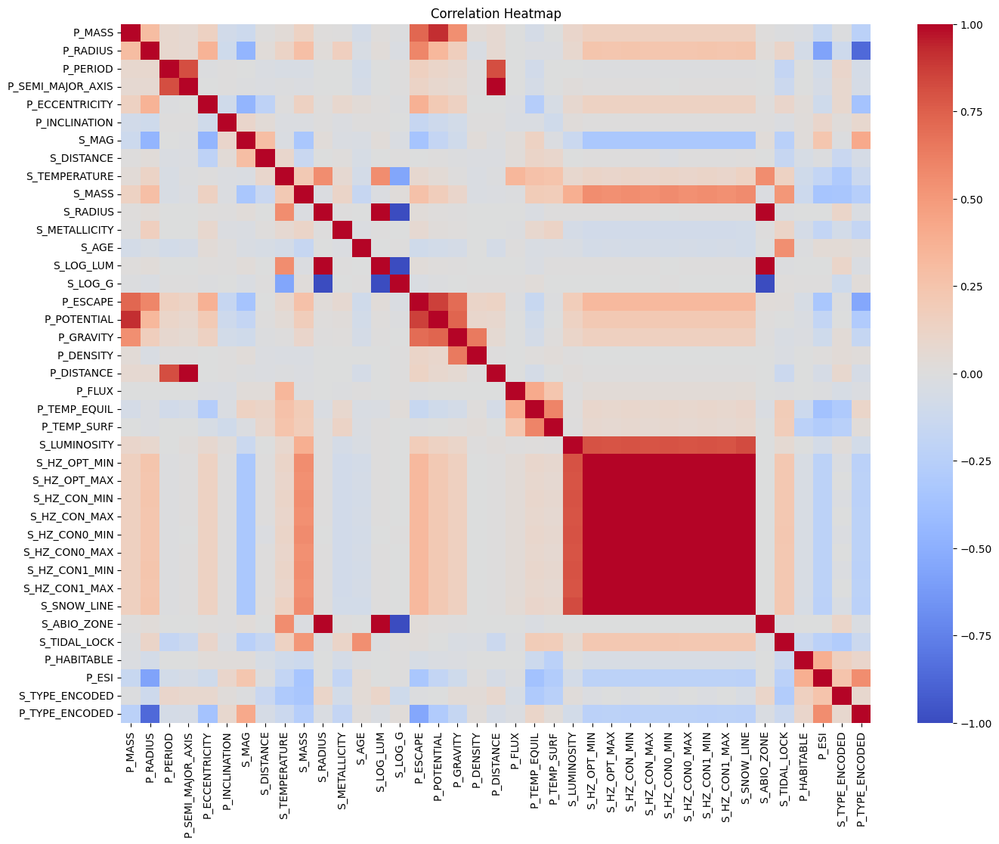


Correlation with Target Variable (P_HABITABLE):
P_HABITABLE          1.000000
P_ESI                0.388684
S_TYPE_ENCODED       0.154039
P_TYPE_ENCODED       0.100190
P_ECCENTRICITY       0.030188
P_INCLINATION        0.023384
S_MAG                0.023284
S_LOG_G              0.002112
P_DENSITY           -0.001212
S_LOG_LUM           -0.002112
S_RADIUS            -0.002112
S_ABIO_ZONE         -0.002114
P_SEMI_MAJOR_AXIS   -0.004970
P_DISTANCE          -0.005025
P_FLUX              -0.005608
P_PERIOD            -0.005916
S_LUMINOSITY        -0.007787
S_AGE               -0.014320
P_GRAVITY           -0.017684
P_MASS              -0.019860
P_POTENTIAL         -0.025460
S_HZ_OPT_MAX        -0.043611
S_HZ_CON1_MAX       -0.043611
S_HZ_CON0_MAX       -0.043611
S_HZ_CON_MAX        -0.043611
S_HZ_CON0_MIN       -0.044668
S_HZ_CON1_MIN       -0.045478
S_HZ_CON_MIN        -0.045479
S_HZ_OPT_MIN        -0.045479
S_SNOW_LINE         -0.047201
P_ESCAPE            -0.047327
S_DISTANCE          -

In [21]:
# Compute correlation matrix
correlation_matrix = data_imputed_final.corr()

# Plot heatmap for correlations
plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", cbar=True)
plt.title("Correlation Heatmap")
plt.show()

# Focus on correlations with the target variable
print("\nCorrelation with Target Variable (P_HABITABLE):")
correlation_with_target = correlation_matrix['P_HABITABLE'].sort_values(ascending=False)
print(correlation_with_target)


### 21. Removing Redundant Features
Objective: Reduce redundancy by removing features with high inter-correlation, particularly those that are weakly correlated with `P_HABITABLE`.

1. **Identified Redundant Features**:
   - Stellar habitability zone features (`S_HZ_*`): High inter-correlation and weak correlation with the target.
   - Features to remove: `S_HZ_CON1_MAX`, `S_HZ_CON1_MIN`, `S_HZ_CON0_MAX`, `S_HZ_CON0_MIN`, `S_HZ_CON_MIN`, `S_HZ_CON_MAX`, `S_HZ_OPT_MIN`, `S_HZ_OPT_MAX`.

2. **Retained Features**:
   - Features with stronger correlations with `P_HABITABLE` (e.g., `P_ESI`, `P_TYPE_ENCODED`, `S_TYPE_ENCODED`).

Below is the implementation:


In [22]:
# List of redundant features to drop
redundant_features = [
    'S_HZ_CON1_MAX', 'S_HZ_CON1_MIN', 'S_HZ_CON0_MAX', 'S_HZ_CON0_MIN',
    'S_HZ_CON_MIN', 'S_HZ_CON_MAX', 'S_HZ_OPT_MIN', 'S_HZ_OPT_MAX'
]

# Drop redundant features
print(f"Removing the following redundant features: {redundant_features}")
data_reduced = data_imputed_final.drop(columns=redundant_features)

# Confirm the updated dataset structure
print("\nUpdated Dataset Structure:")
print(data_reduced.info())


Removing the following redundant features: ['S_HZ_CON1_MAX', 'S_HZ_CON1_MIN', 'S_HZ_CON0_MAX', 'S_HZ_CON0_MIN', 'S_HZ_CON_MIN', 'S_HZ_CON_MAX', 'S_HZ_OPT_MIN', 'S_HZ_OPT_MAX']

Updated Dataset Structure:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5599 entries, 0 to 5598
Data columns (total 31 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   P_MASS             5599 non-null   float64
 1   P_RADIUS           5599 non-null   float64
 2   P_PERIOD           5599 non-null   float64
 3   P_SEMI_MAJOR_AXIS  5599 non-null   float64
 4   P_ECCENTRICITY     5599 non-null   float64
 5   P_INCLINATION      5599 non-null   float64
 6   S_MAG              5599 non-null   float64
 7   S_DISTANCE         5599 non-null   float64
 8   S_TEMPERATURE      5599 non-null   float64
 9   S_MASS             5599 non-null   float64
 10  S_RADIUS           5599 non-null   float64
 11  S_METALLICITY      5599 non-null   float64
 12  S_AGE       

### 22. Rechecking Correlation Matrix
Objective: Verify that redundant features have been effectively removed and identify any remaining correlations among features.
1. Compute the correlation matrix for the updated dataset.
2. Visualize the correlations using a heatmap.
3. Highlight any remaining highly correlated features (if any).

Below is the implementation:


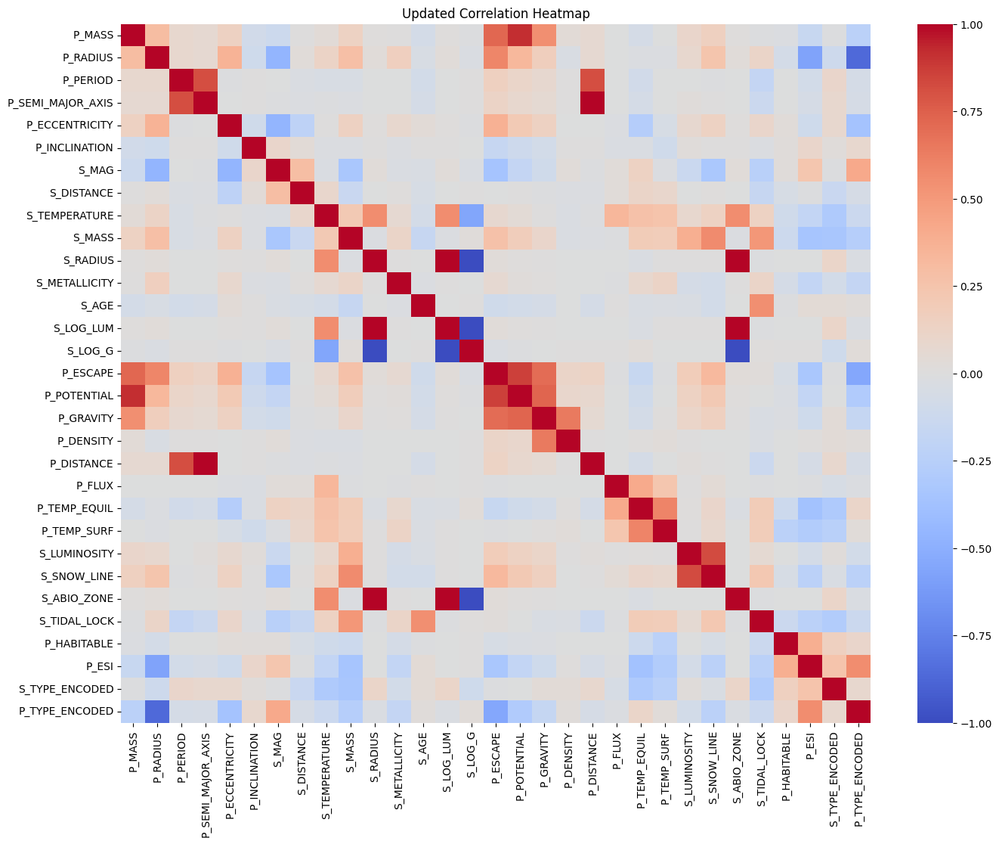


Highly Correlated Feature Pairs (|correlation| > 0.85):
S_RADIUS           S_LOG_LUM            1.000000
S_LOG_LUM          S_RADIUS             1.000000
                   S_ABIO_ZONE          1.000000
S_ABIO_ZONE        S_LOG_LUM            1.000000
S_RADIUS           S_ABIO_ZONE          1.000000
S_ABIO_ZONE        S_RADIUS             1.000000
P_DISTANCE         P_SEMI_MAJOR_AXIS    0.999915
P_SEMI_MAJOR_AXIS  P_DISTANCE           0.999915
P_POTENTIAL        P_MASS               0.920803
P_MASS             P_POTENTIAL          0.920803
P_POTENTIAL        P_ESCAPE             0.866009
P_ESCAPE           P_POTENTIAL          0.866009
P_RADIUS           P_TYPE_ENCODED      -0.865788
P_TYPE_ENCODED     P_RADIUS            -0.865788
S_ABIO_ZONE        S_LOG_G             -1.000000
S_LOG_G            S_ABIO_ZONE         -1.000000
                   S_RADIUS            -1.000000
S_RADIUS           S_LOG_G             -1.000000
S_LOG_LUM          S_LOG_G             -1.000000
S_LOG_G     

In [23]:
# Compute the updated correlation matrix
updated_correlation_matrix = data_reduced.corr()

# Plot the updated heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(updated_correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", cbar=True)
plt.title("Updated Correlation Heatmap")
plt.show()

# Check for remaining highly correlated features (absolute correlation > 0.85)
high_corr_pairs = updated_correlation_matrix.unstack().sort_values(kind="quicksort", ascending=False)
high_corr_pairs = high_corr_pairs[high_corr_pairs != 1]  # Exclude self-correlation
high_corr_pairs = high_corr_pairs[high_corr_pairs.abs() > 0.85]  # Filter for high correlation

print("\nHighly Correlated Feature Pairs (|correlation| > 0.85):")
print(high_corr_pairs)


### 23. Removing Remaining Redundant Features
Objective: Eliminate highly correlated features to reduce redundancy and simplify the dataset.

1. Identify and remove one feature from each highly correlated pair:
   - **S_RADIUS**: Retain and drop `S_LOG_LUM`, `S_ABIO_ZONE`, and `S_LOG_G`.
   - **P_DISTANCE**: Retain and drop `P_SEMI_MAJOR_AXIS`.
   - **P_MASS**: Retain and drop `P_POTENTIAL`.
   - **P_RADIUS**: Retain and drop `P_TYPE_ENCODED`.

2. Validate the updated dataset structure and correlation matrix.


Removing the following redundant features: ['S_LOG_LUM', 'S_ABIO_ZONE', 'S_LOG_G', 'P_SEMI_MAJOR_AXIS', 'P_POTENTIAL', 'P_TYPE_ENCODED']

Updated Dataset Structure After Removing Redundancy:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5599 entries, 0 to 5598
Data columns (total 25 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   P_MASS          5599 non-null   float64
 1   P_RADIUS        5599 non-null   float64
 2   P_PERIOD        5599 non-null   float64
 3   P_ECCENTRICITY  5599 non-null   float64
 4   P_INCLINATION   5599 non-null   float64
 5   S_MAG           5599 non-null   float64
 6   S_DISTANCE      5599 non-null   float64
 7   S_TEMPERATURE   5599 non-null   float64
 8   S_MASS          5599 non-null   float64
 9   S_RADIUS        5599 non-null   float64
 10  S_METALLICITY   5599 non-null   float64
 11  S_AGE           5599 non-null   float64
 12  P_ESCAPE        5599 non-null   float64
 13  P_GRAVITY       5599 n

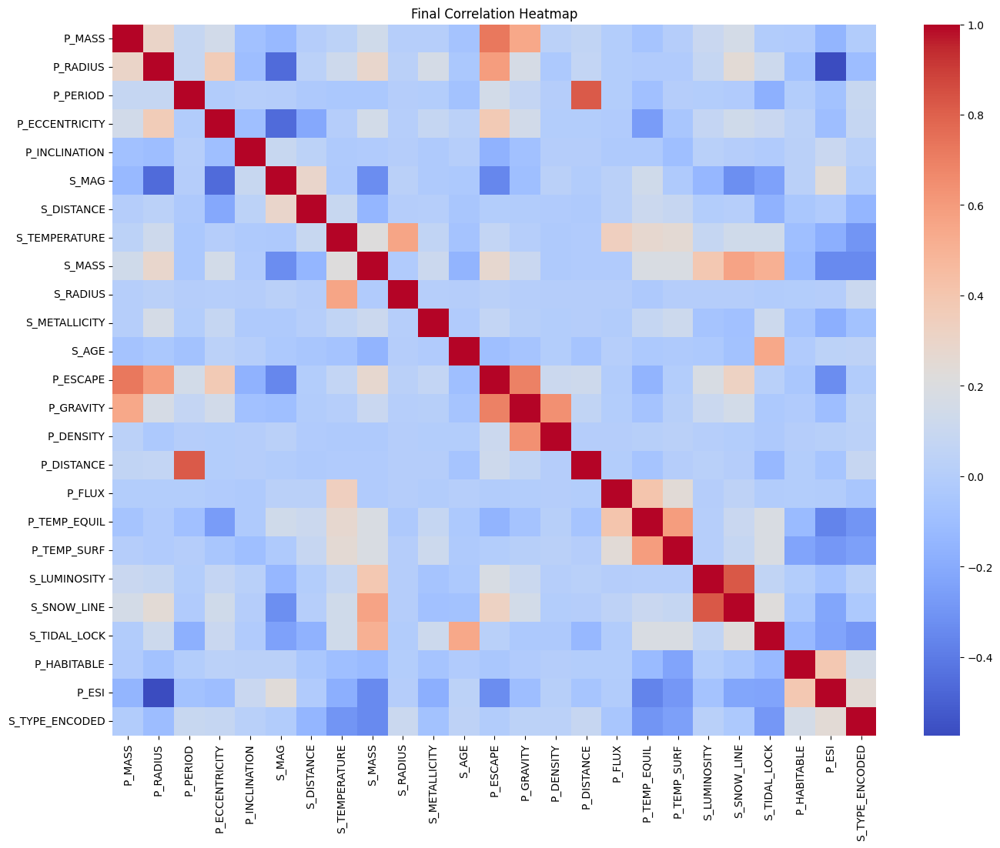

In [24]:
# List of features to drop based on high correlation
features_to_drop = [
    'S_LOG_LUM', 'S_ABIO_ZONE', 'S_LOG_G',
    'P_SEMI_MAJOR_AXIS', 'P_POTENTIAL', 'P_TYPE_ENCODED'
]

# Drop the redundant features
print(f"Removing the following redundant features: {features_to_drop}")
data_final = data_reduced.drop(columns=features_to_drop)

# Confirm the updated dataset structure
print("\nUpdated Dataset Structure After Removing Redundancy:")
print(data_final.info())

# Recheck correlation matrix
final_correlation_matrix = data_final.corr()

# Plot heatmap for final correlation matrix
plt.figure(figsize=(16, 12))
sns.heatmap(final_correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", cbar=True)
plt.title("Final Correlation Heatmap")
plt.show()


### 24. Feature Importance Analysis
Objective: Identify the most important features for predicting `P_HABITABLE` using a Random Forest Classifier.

1. Fit a Random Forest model to the dataset.
2. Extract and rank features by their importance scores.
3. Visualize the feature importance using a bar chart.

Below is the implementation:


Training Random Forest Classifier for Feature Importance...

Top 10 Features by Importance:
         Feature  Importance
18   P_TEMP_SURF    0.313389
22         P_ESI    0.170971
1       P_RADIUS    0.060925
0         P_MASS    0.050001
17  P_TEMP_EQUIL    0.049851
16        P_FLUX    0.049617
12      P_ESCAPE    0.041466
14     P_DENSITY    0.031866
2       P_PERIOD    0.028651
15    P_DISTANCE    0.024020


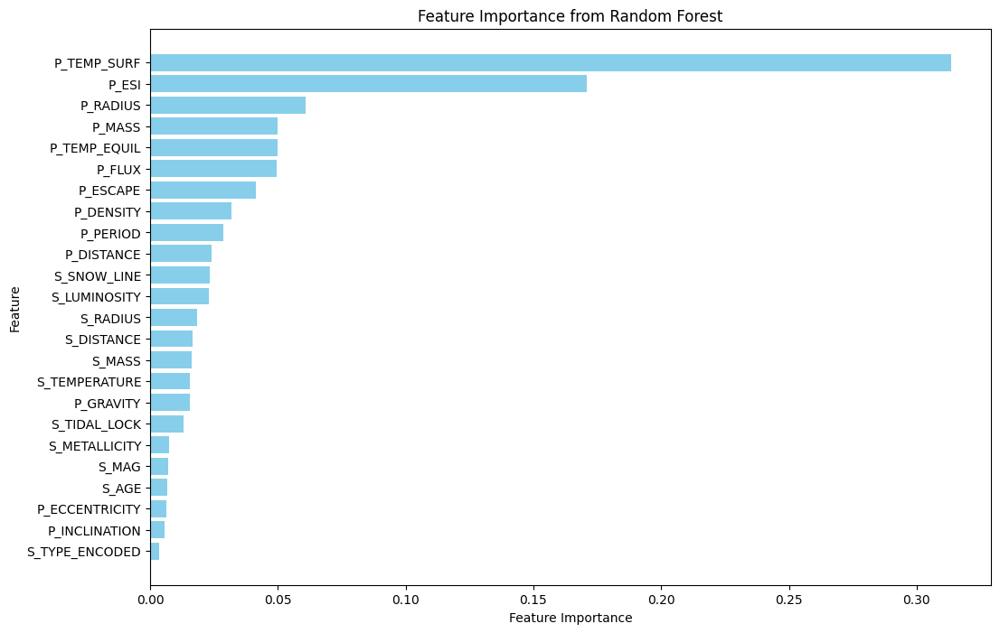

In [25]:
# Define features and target
X = data_final.drop(columns=['P_HABITABLE'])  # Features
y = data_final['P_HABITABLE']                # Target

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Train a Random Forest Classifier
print("Training Random Forest Classifier for Feature Importance...")
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Get feature importances
feature_importances = rf_model.feature_importances_
feature_names = X.columns

# Create a DataFrame for visualization
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Display top 10 important features
print("\nTop 10 Features by Importance:")
print(importance_df.head(10))

# Plot feature importance
plt.figure(figsize=(12, 8))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importance from Random Forest')
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()


### 25. Minimal EDA
Objective: Gain insights into key features and their relationship with the target variable.

1. Visualize distributions of key features (`P_TEMP_SURF`, `P_ESI`, etc.).
2. Explore feature relationships with the target (`P_HABITABLE`) using boxplots and scatterplots.
3. Use a pairplot to examine feature interactions and patterns.

All insights will be combined into a single image for simplicity.


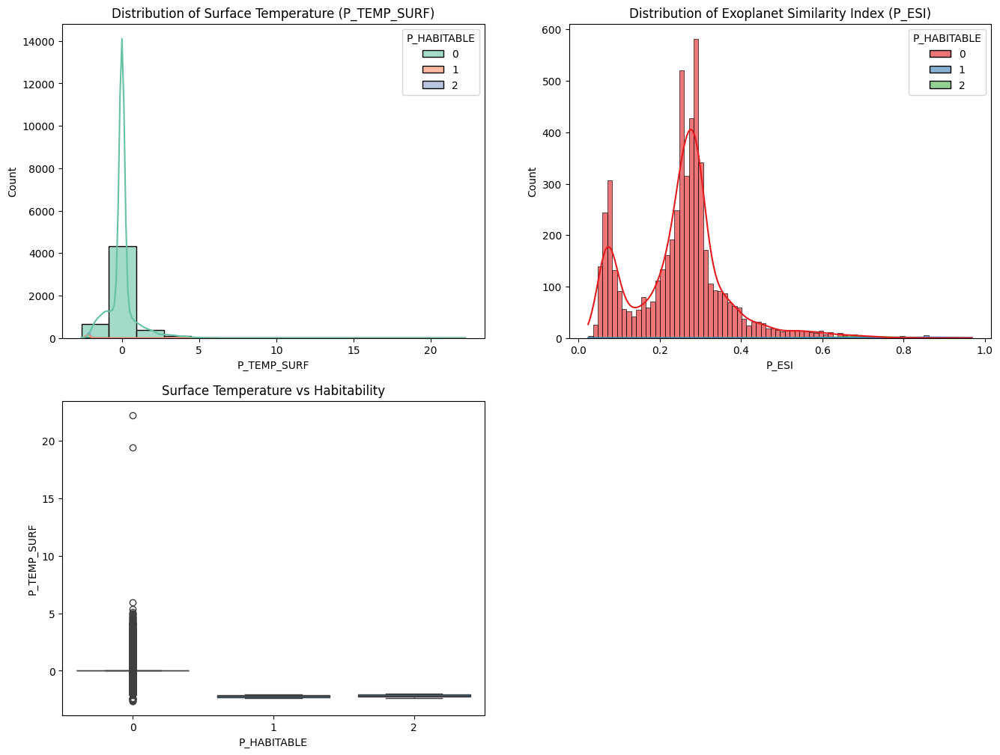

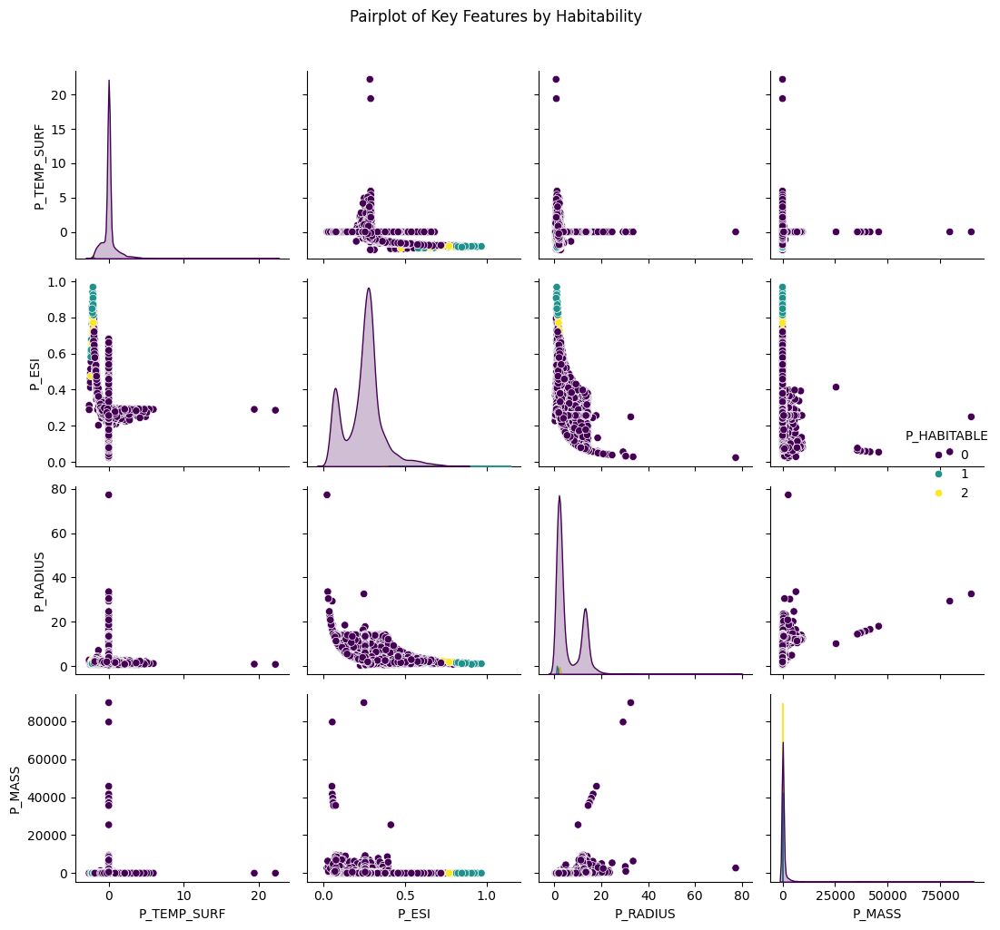

In [26]:
# Create a figure with subplots for EDA
plt.figure(figsize=(16, 12))

# 1. Distribution of P_TEMP_SURF
plt.subplot(2, 2, 1)
sns.histplot(data_final, x='P_TEMP_SURF', hue='P_HABITABLE', kde=True, palette='Set2', alpha=0.6)
plt.title('Distribution of Surface Temperature (P_TEMP_SURF)')

# 2. Distribution of P_ESI
plt.subplot(2, 2, 2)
sns.histplot(data_final, x='P_ESI', hue='P_HABITABLE', kde=True, palette='Set1', alpha=0.6)
plt.title('Distribution of Exoplanet Similarity Index (P_ESI)')

# 3. Boxplot of P_TEMP_SURF by P_HABITABLE
plt.subplot(2, 2, 3)
sns.boxplot(data=data_final, x='P_HABITABLE', y='P_TEMP_SURF')
plt.title('Surface Temperature vs Habitability')

# 4. Pairplot for Top Features (P_TEMP_SURF, P_ESI, P_RADIUS, P_MASS) by P_HABITABLE
sns.pairplot(data_final, vars=['P_TEMP_SURF', 'P_ESI', 'P_RADIUS', 'P_MASS'], hue='P_HABITABLE', palette='viridis', diag_kind='kde')
plt.suptitle('Pairplot of Key Features by Habitability', y=1.02)

plt.tight_layout()
plt.show()

### 26. Initial Train-Test Split
Objective: Divide the dataset into:
1. Training + Validation Set (80%)
2. Test Set (20%)

- Use stratified sampling to maintain the class proportions across the splits.
- The test set will remain untouched and only be used for final evaluation.
Below is the implementation:


In [27]:
# Define features and target
X = data_final.drop(columns=['P_HABITABLE'])  # Features
y = data_final['P_HABITABLE']                # Target

# Perform initial train-test split
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Display the class distribution
print("Test Set Class Distribution:", y_test.value_counts(normalize=True))
print("Train+Validation Set Class Distribution:", y_temp.value_counts(normalize=True))


Test Set Class Distribution: P_HABITABLE
0    0.987500
2    0.007143
1    0.005357
Name: proportion, dtype: float64
Train+Validation Set Class Distribution: P_HABITABLE
0    0.987497
2    0.007368
1    0.005135
Name: proportion, dtype: float64


### 27. Further Split Train+Validation into Training and Validation
Objective: Split the training + validation set (80%) into:
1. Training Set (70% of 80%, ≈56% of total dataset).
2. Validation Set (30% of 80%, ≈24% of total dataset).

- Use stratified sampling to maintain class proportions in both sets.
Below is the implementation:


In [28]:
# Perform training + validation split
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.3, random_state=42, stratify=y_temp)

# Display the class distributions
print("Training Set Class Distribution:", y_train.value_counts(normalize=True))
print("Validation Set Class Distribution:", y_val.value_counts(normalize=True))


Training Set Class Distribution: P_HABITABLE
0    0.987560
2    0.007337
1    0.005104
Name: proportion, dtype: float64
Validation Set Class Distribution: P_HABITABLE
0    0.987351
2    0.007440
1    0.005208
Name: proportion, dtype: float64


### 28. Resampling the Training Set with SMOTE
Objective: Balance the class distribution in the training set using SMOTE.

- Oversample the minority class (`P_HABITABLE = 1`) by generating synthetic samples.
- Resampling is applied only to the training set to avoid information leakage.
Below is the implementation:


In [29]:
# Create a custom SMOTE class to override deprecated methods
class CustomSMOTE(SMOTE):
    def _validate_data(self, X, y, reset=True, **kwargs):
        """
        Overrides the deprecated BaseEstimator._validate_data in SMOTE
        with sklearn's validate_data method.
        """
        return validation.check_array(X, **kwargs), validation.check_array(y, ensure_2d=False, **kwargs)

# Apply CustomSMOTE to balance the training set
print("Original Training Set Class Distribution:", Counter(y_train))
custom_smote = CustomSMOTE(random_state=42)
X_train_resampled, y_train_resampled = custom_smote.fit_resample(X_train, y_train)
print("Resampled Training Set Class Distribution:", Counter(y_train_resampled))


Original Training Set Class Distribution: Counter({0: 3096, 2: 23, 1: 16})
Resampled Training Set Class Distribution: Counter({0: 3096, 1: 3096, 2: 3096})


### 29. Training and Evaluating Multiple Models
Objective: Train a variety of models and compare their performance.

1. Train the following models: Logistic Regression, Random Forest, Gradient Boosting models (XGBoost, LightGBM, CatBoost), SVM, KNN, and Neural Network.
2. Evaluate using metrics like precision, recall, F1-score, and ROC-AUC.
3. Select the best-performing model for further analysis and explainability (XAI).

Below is the implementation:


Training Logistic Regression...
Training Random Forest...
Training XGBoost...
Training LightGBM...
Training CatBoost...
Training SVM...
Training KNN...
Training Neural Network...
Model Performance Comparison:
                 Model  Precision    Recall  F1-Score   ROC-AUC
1        Random Forest   0.857143  0.857143  0.857143  0.999764
4             CatBoost   1.000000  0.714286  0.833333  0.999950
2              XGBoost   1.000000  0.571429  0.727273  0.999697
3             LightGBM   1.000000  0.571429  0.727273  0.999925
0  Logistic Regression   0.555556  0.714286  0.625000  0.997618
7       Neural Network   0.208333  0.714286  0.322581  0.993468
6                  KNN   0.139535  0.857143  0.240000  0.914368
5                  SVM   0.121212  0.571429  0.200000  0.908377


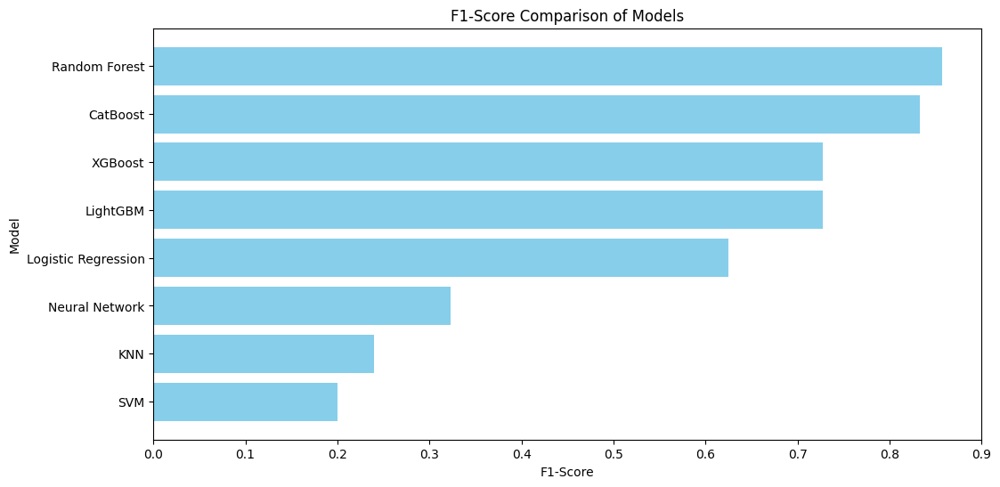

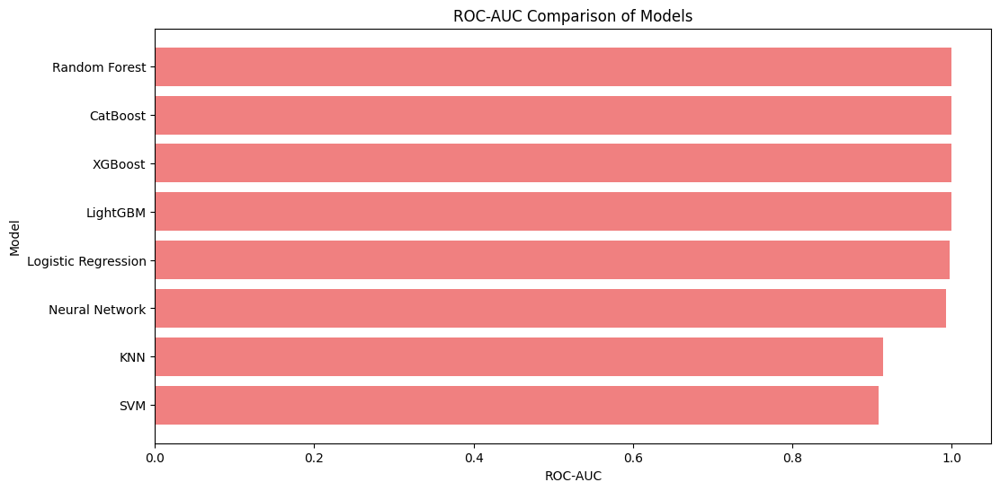

In [30]:
# Define models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight="balanced"),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced"),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric="logloss", random_state=42),
    "LightGBM": LGBMClassifier(verbose=-1, force_row_wise=True, random_state=42),  # Suppressed LightGBM warnings
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42),  # Suppressed CatBoost warnings
    "SVM": SVC(probability=True, class_weight="balanced", random_state=42),
    "KNN": KNeighborsClassifier(),
    "Neural Network": MLPClassifier(max_iter=1000, random_state=42)
}

# Train and evaluate each model
results = []
for model_name, model in models.items():
    print(f"Training {model_name}...")

    # Train the model
    model.fit(X_train_resampled, y_train_resampled)

    # Predict on the validation set
    y_pred = model.predict(X_val)
    y_prob = model.predict_proba(X_val) if hasattr(model, "predict_proba") else None

    # Calculate metrics
    report = classification_report(y_val, y_pred, output_dict=True)
    roc_auc = roc_auc_score(y_val, y_prob, multi_class="ovr") if y_prob is not None else None

    # Store results
    results.append({
        "Model": model_name,
        "Precision": report["1"]["precision"],
        "Recall": report["1"]["recall"],
        "F1-Score": report["1"]["f1-score"],
        "ROC-AUC": roc_auc
    })

# Create a DataFrame for results
results_df = pd.DataFrame(results)
results_df.sort_values(by="F1-Score", ascending=False, inplace=True)

# Display results as a DataFrame
print("Model Performance Comparison:")
print(results_df)

# Visualize results using a bar chart
# Plot F1-Score for each model
plt.figure(figsize=(12, 6))
plt.barh(results_df["Model"], results_df["F1-Score"], color="skyblue")
plt.xlabel("F1-Score")
plt.ylabel("Model")
plt.title("F1-Score Comparison of Models")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()

# Plot ROC-AUC for each model
plt.figure(figsize=(12, 6))
plt.barh(results_df["Model"], results_df["ROC-AUC"], color="lightcoral")
plt.xlabel("ROC-AUC")
plt.ylabel("Model")
plt.title("ROC-AUC Comparison of Models")
plt.gca().invert_yaxis()
plt.show()


### 30. Comprehensive Model Performance Analysis
Objective:
1. Visualize and analyze the performance of the models using:
   - Confusion Matrix
   - Precision, Recall, F1-Score, F2-Score
   - ROC-AUC
2. Compare models across metrics with bar plots.

Below is the implementation:


Evaluating Logistic Regression...
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1327
           1       0.56      0.71      0.62         7
           2       0.37      1.00      0.54        10

    accuracy                           0.98      1344
   macro avg       0.64      0.90      0.72      1344
weighted avg       0.99      0.98      0.99      1344

Evaluating Random Forest...
Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1327
           1       0.86      0.86      0.86         7
           2       0.82      0.90      0.86        10

    accuracy                           1.00      1344
   macro avg       0.89      0.92      0.90      1344
weighted avg       1.00      1.00      1.00      1344

Evaluating XGBoost...
Classification Report for XGBoost:
              precision    reca

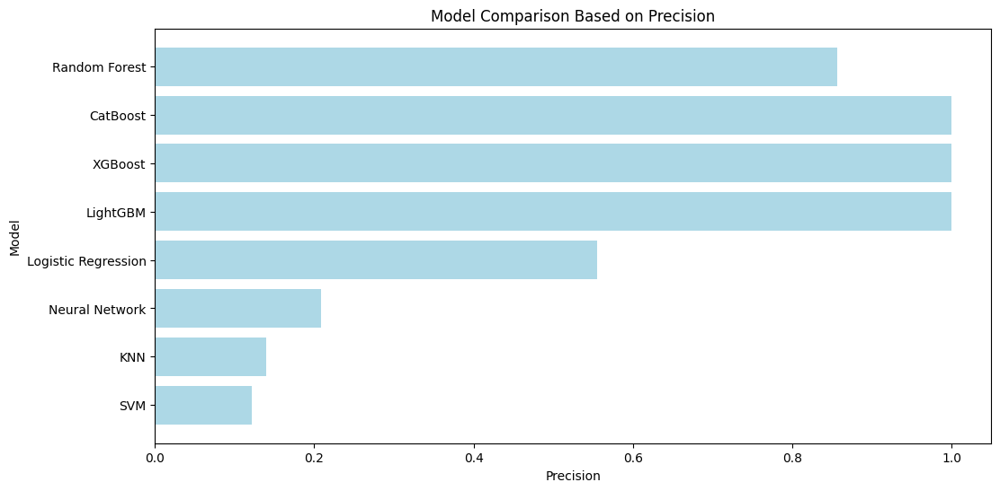

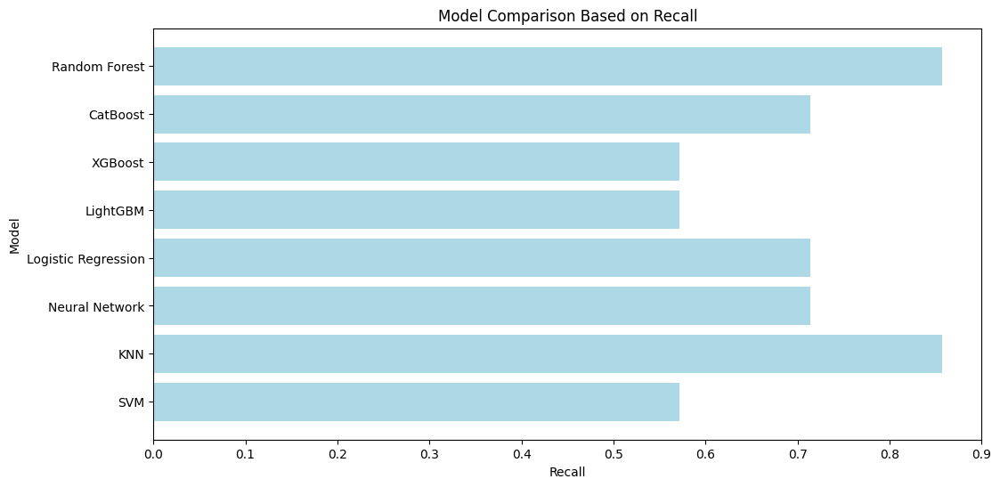

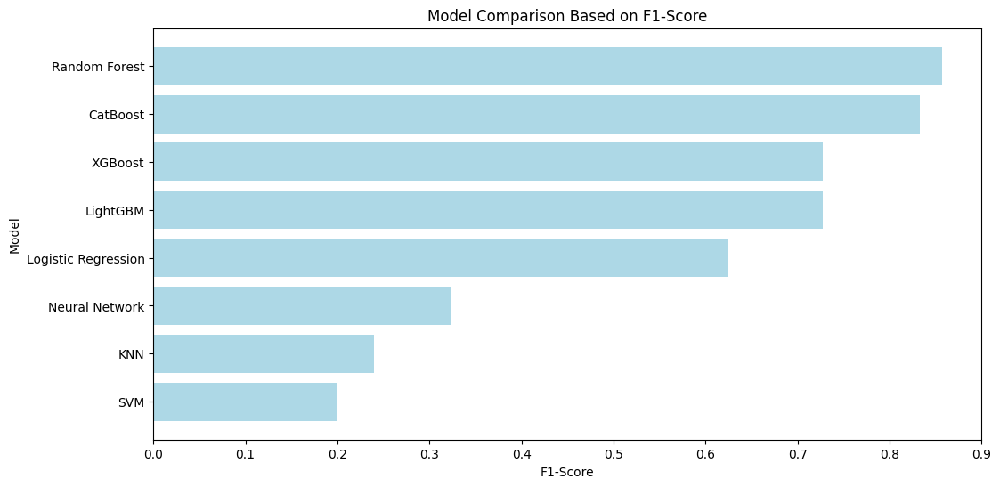

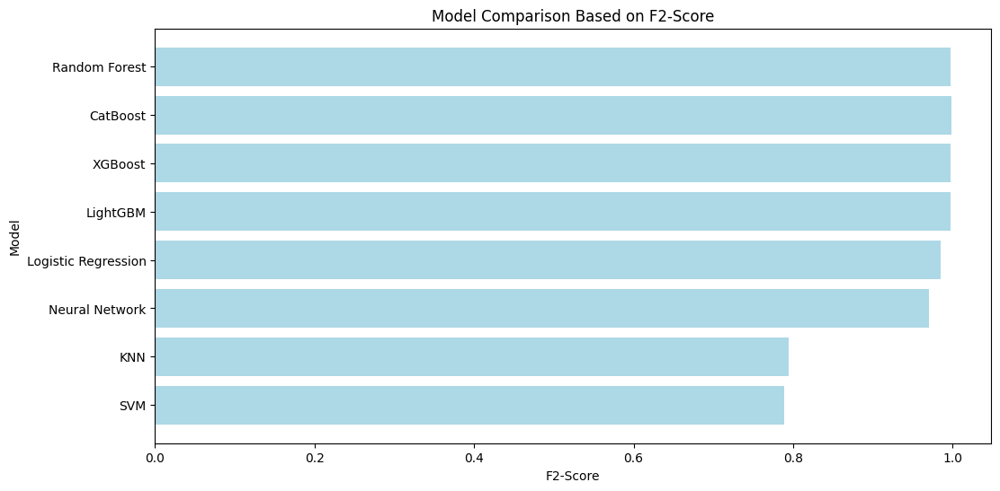

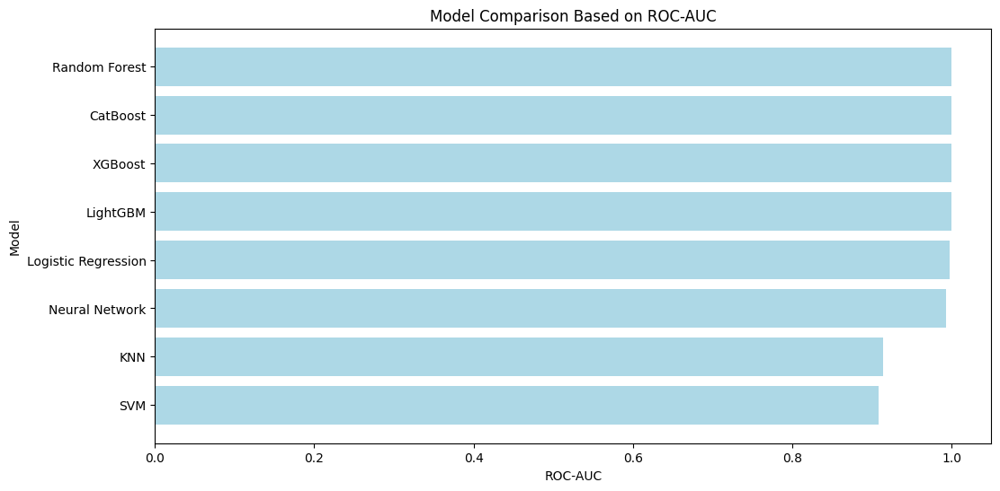

<Figure size 800x600 with 0 Axes>

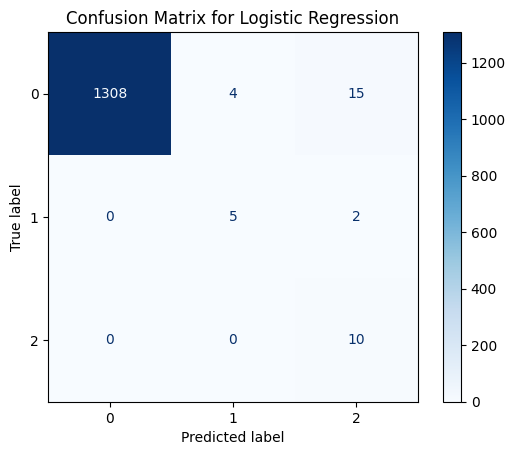

<Figure size 800x600 with 0 Axes>

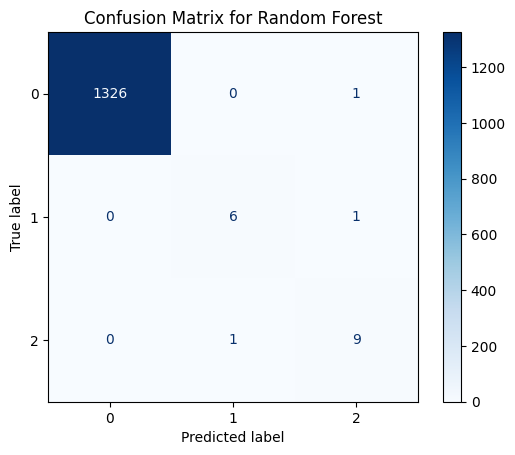

<Figure size 800x600 with 0 Axes>

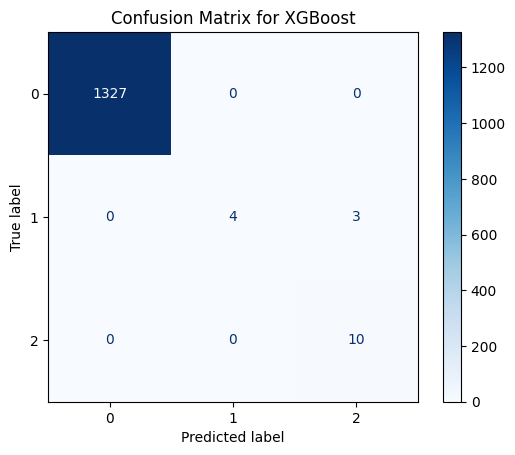

<Figure size 800x600 with 0 Axes>

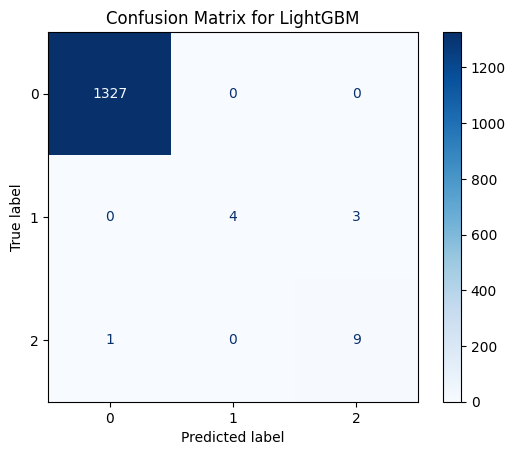

<Figure size 800x600 with 0 Axes>

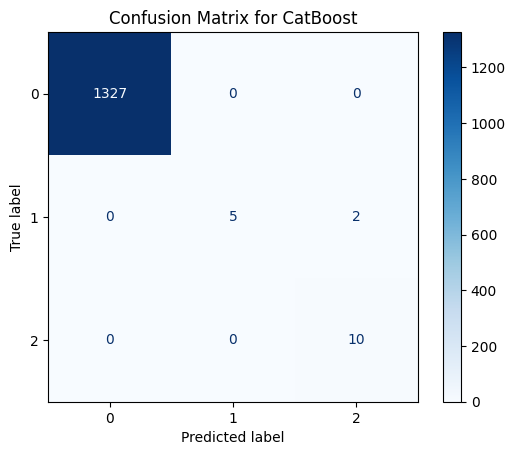

<Figure size 800x600 with 0 Axes>

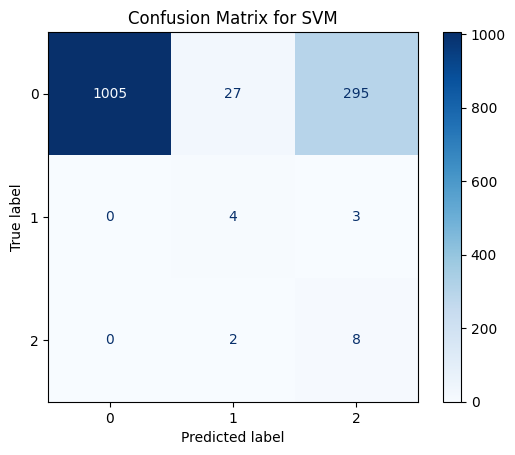

<Figure size 800x600 with 0 Axes>

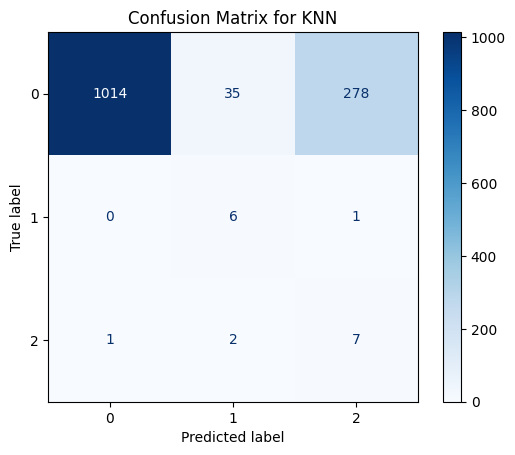

<Figure size 800x600 with 0 Axes>

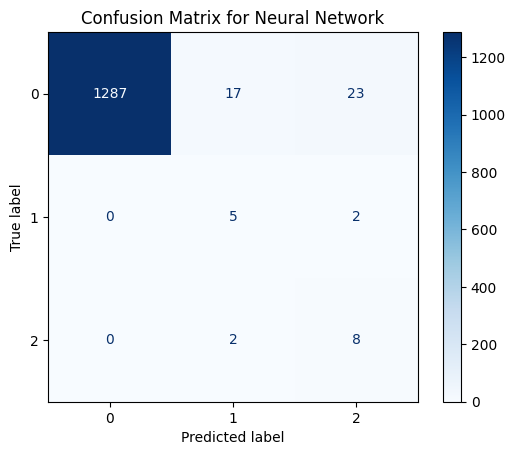

In [31]:
# Initialize lists to store confusion matrices and F2-scores
confusion_matrices = {}
f2_scores = []

# Analyze each model's performance
for model_name, model in models.items():
    print(f"Evaluating {model_name}...")

    # Predict on validation set
    y_pred = model.predict(X_val)
    y_prob = model.predict_proba(X_val) if hasattr(model, "predict_proba") else None

    # Confusion Matrix
    cm = confusion_matrix(y_val, y_pred)
    confusion_matrices[model_name] = cm

    # F2-Score Calculation
    f2 = fbeta_score(y_val, y_pred, beta=2, average='weighted')  # Weighted average for multi-class
    f2_scores.append({"Model": model_name, "F2-Score": f2})

    # Print classification report for insights
    print(f"Classification Report for {model_name}:")
    print(classification_report(y_val, y_pred))

# Add F2-Score to results DataFrame
f2_scores_df = pd.DataFrame(f2_scores)
results_df = results_df.merge(f2_scores_df, on="Model")

# Sort by F1-Score for better ranking
results_df.sort_values(by="F1-Score", ascending=False, inplace=True)

# Display results
print("\nUpdated Model Performance Comparison:")
print(results_df)

# Visualize metrics comparison
metrics = ["Precision", "Recall", "F1-Score", "F2-Score", "ROC-AUC"]

for metric in metrics:
    plt.figure(figsize=(12, 6))
    plt.barh(results_df["Model"], results_df[metric], color="lightblue")
    plt.xlabel(metric)
    plt.ylabel("Model")
    plt.title(f"Model Comparison Based on {metric}")
    plt.gca().invert_yaxis()
    plt.show()

# Visualize Confusion Matrices
for model_name, cm in confusion_matrices.items():
    plt.figure(figsize=(8, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_val))
    disp.plot(cmap="Blues", values_format="d")
    plt.title(f"Confusion Matrix for {model_name}")
    plt.show()


### 31. Accuracy Evaluation
Objective:
- Calculate and display the accuracy of all models for a final performance comparison.

Below is the implementation:


Calculating accuracy for Logistic Regression...
Calculating accuracy for Random Forest...
Calculating accuracy for XGBoost...
Calculating accuracy for LightGBM...
Calculating accuracy for CatBoost...
Calculating accuracy for SVM...
Calculating accuracy for KNN...
Calculating accuracy for Neural Network...

Model Accuracy Comparison (in Percentage):
                 Model  Accuracy (%)
1        Random Forest     99.776786
2              XGBoost     99.776786
3             LightGBM     99.702381
0  Logistic Regression     98.437500
4             CatBoost     97.494818
7       Neural Network     96.726190
6                  KNN     76.413690
5                  SVM     75.669643


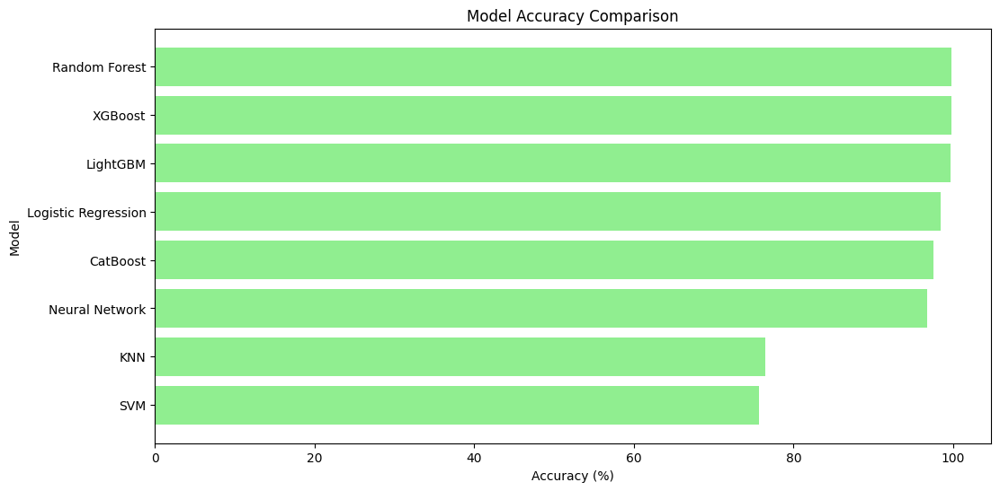

In [32]:
# Initialize a list to store accuracy results
accuracy_results = []

# Calculate accuracy for each model
for model_name, model in models.items():
    print(f"Calculating accuracy for {model_name}...")

    # Ensure y_pred contains predicted class labels
    y_pred = model.predict(X_val)  # This will return class labels

    # Calculate accuracy as a percentage
    accuracy = np.mean(y_pred == y_val.to_numpy()) * 100  # Convert to percentage
    accuracy_results.append({"Model": model_name, "Accuracy (%)": accuracy})

# Create a DataFrame for accuracy results
accuracy_df = pd.DataFrame(accuracy_results)
accuracy_df.sort_values(by="Accuracy (%)", ascending=False, inplace=True)

# Display accuracy results
print("\nModel Accuracy Comparison (in Percentage):")
print(accuracy_df)

# Visualize accuracy
plt.figure(figsize=(12, 6))
plt.barh(accuracy_df["Model"], accuracy_df["Accuracy (%)"], color="lightgreen")
plt.xlabel("Accuracy (%)")
plt.ylabel("Model")
plt.title("Model Accuracy Comparison")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()


### 32. Fine-Tuning Random Forest, XGBoost, and LightGBM
Objective:
1. Perform hyperparameter tuning using Randomized Search for the three top models.
2. Optimize for F1-Score to prioritize both Precision and Recall.

Below is the implementation:


In [33]:
# Define hyperparameter grids for each model
param_grids = {
    "Random Forest": {
        "n_estimators": [50, 100, 200],
        "max_depth": [None, 10, 20, 30],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4],
        "bootstrap": [True, False],
    },
    "XGBoost": {
        "classifier__n_estimators": [50, 100, 200],
        "classifier__max_depth": [3, 6, 10],
        "classifier__learning_rate": [0.01, 0.1, 0.2],
        "classifier__subsample": [0.6, 0.8, 1.0],
        "classifier__colsample_bytree": [0.6, 0.8, 1.0],
    },
    "LightGBM": {
        "n_estimators": [50, 100, 200],
        "max_depth": [-1, 10, 20],
        "learning_rate": [0.01, 0.1, 0.2],
        "num_leaves": [31, 50, 100],
    },
}

# Initialize models
models_to_tune = {
    "Random Forest": RandomForestClassifier(random_state=42, class_weight="balanced"),
    "XGBoost": Pipeline([
        ("classifier", XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="logloss"))
    ]),
    "LightGBM": LGBMClassifier(random_state=42),
}

# Fine-tune each model using RandomizedSearchCV
tuned_models = {}
for model_name, model in models_to_tune.items():
    print(f"Tuning {model_name}...")
    randomized_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grids[model_name],
        scoring="f1_weighted",  # Optimize for F1-Score
        n_iter=20,  # Number of random parameter combinations to try
        cv=3,  # 3-fold cross-validation
        random_state=42,
        verbose=1,
        n_jobs=-1,  # Parallelize across all available cores
    )
    randomized_search.fit(X_train_resampled, y_train_resampled)
    tuned_models[model_name] = randomized_search.best_estimator_

    print(f"Best parameters for {model_name}:")
    print(randomized_search.best_params_)


Tuning Random Forest...
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters for Random Forest:
{'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': 30, 'bootstrap': False}
Tuning XGBoost...
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters for XGBoost:
{'classifier__subsample': 0.6, 'classifier__n_estimators': 200, 'classifier__max_depth': 10, 'classifier__learning_rate': 0.01, 'classifier__colsample_bytree': 0.6}
Tuning LightGBM...
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters for LightGBM:
{'num_leaves': 31, 'n_estimators': 200, 'max_depth': -1, 'learning_rate': 0.1}


### 33. Evaluating Fine-Tuned Models
Objective:
1. Use the fine-tuned models to make predictions on the validation set.
2. Evaluate performance using key metrics: Precision, Recall, F1-Score, ROC-AUC, and Accuracy.
3. Compare results visually to determine the best-performing model.

Below is the implementation.


Evaluating Random Forest...
Evaluating XGBoost...
Evaluating LightGBM...

Final Evaluation Results:
           Model  Precision    Recall  F1-Score  Accuracy (%)   ROC-AUC
2       LightGBM   1.000000  1.000000  1.000000     99.925595  0.999885
1        XGBoost   1.000000  0.857143  0.923077     99.851190  0.999904
0  Random Forest   0.857143  0.857143  0.857143     99.851190  0.999889


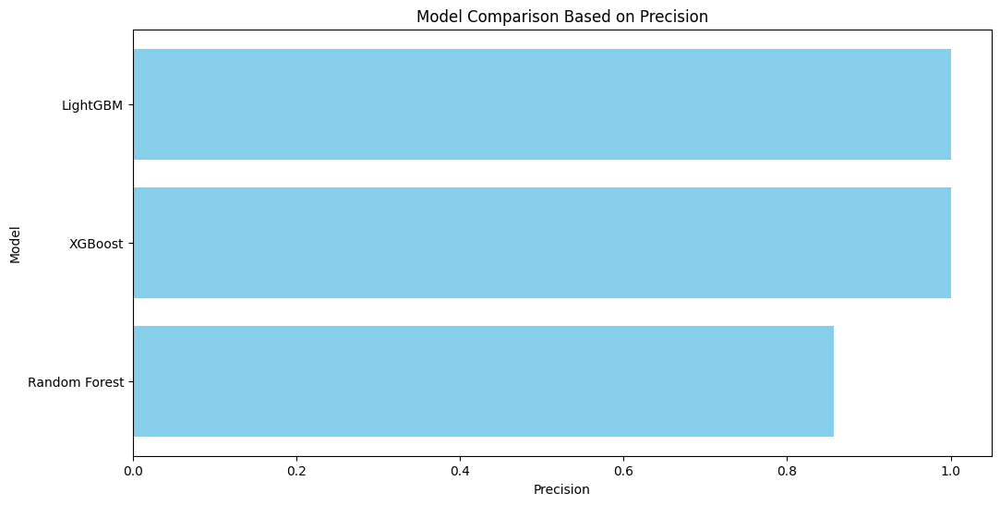

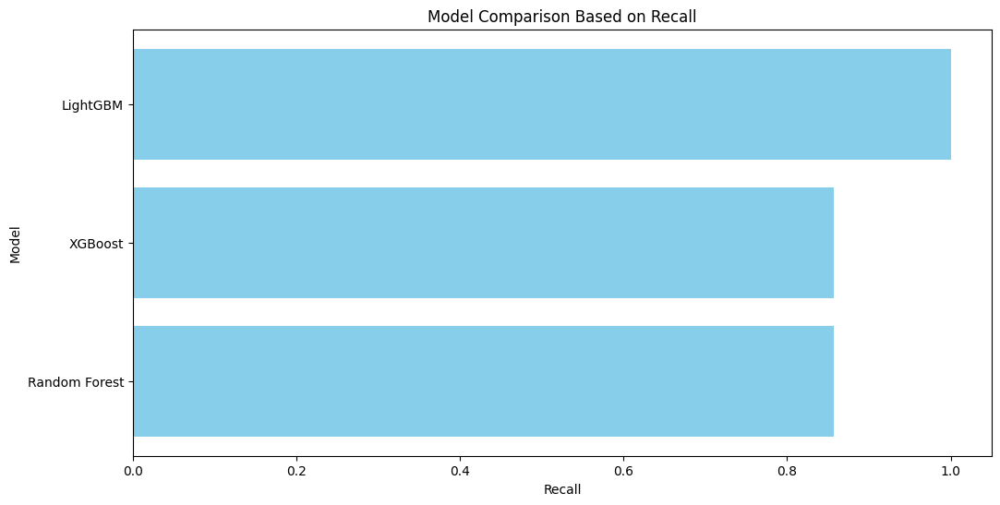

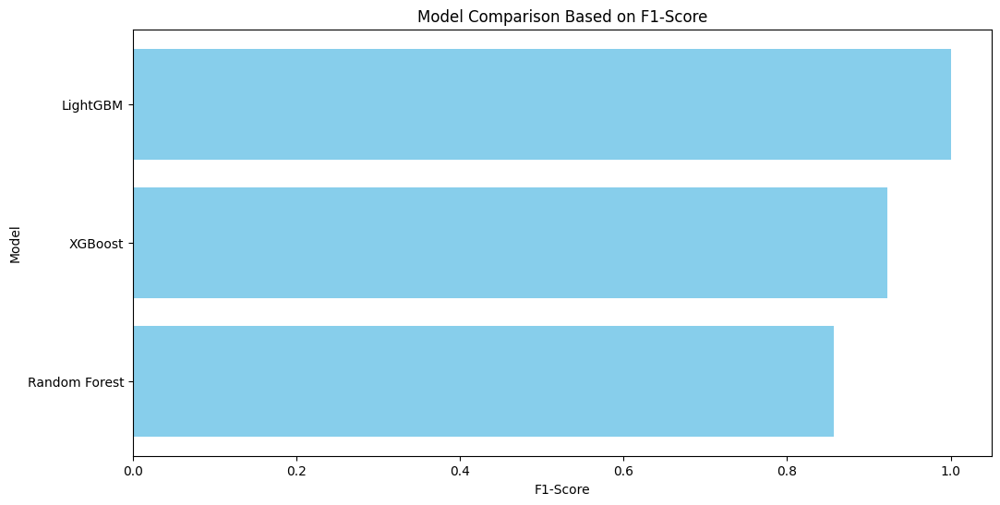

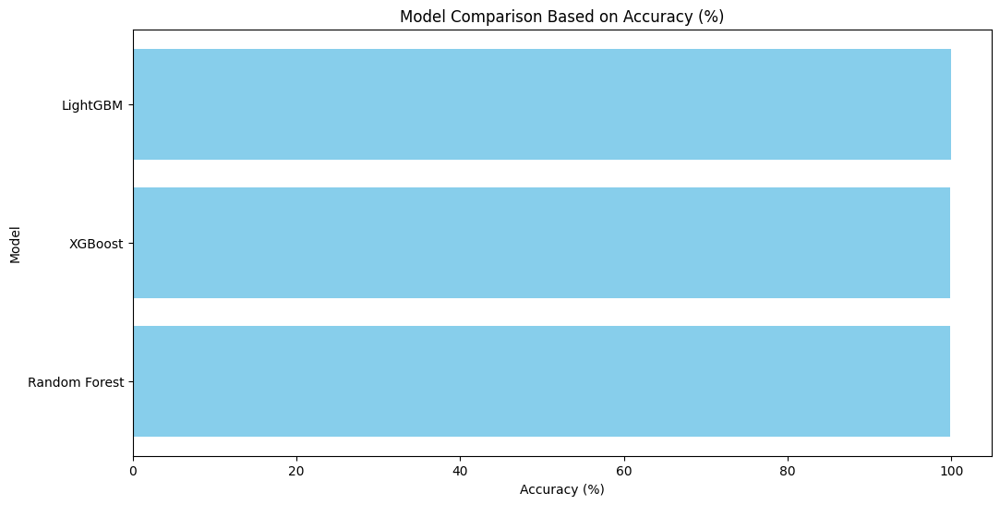

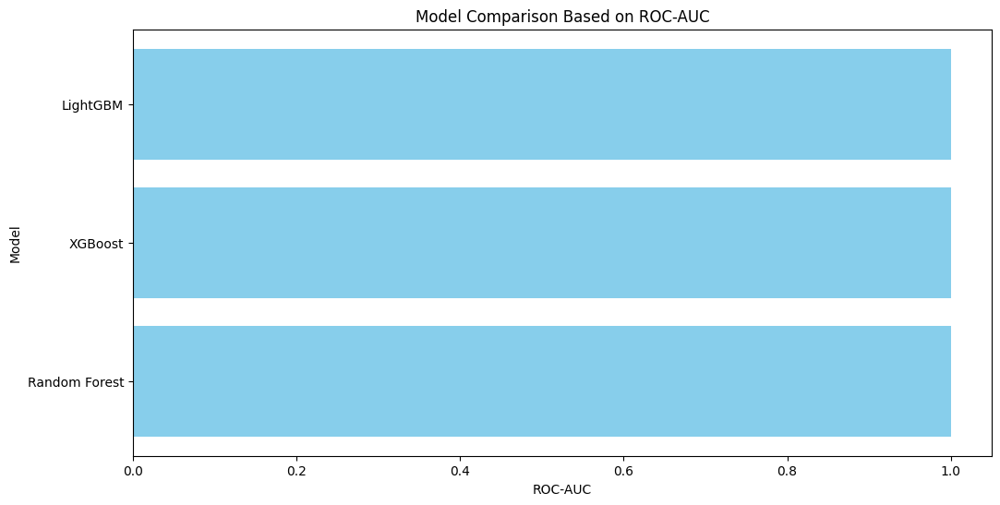

<Figure size 800x600 with 0 Axes>

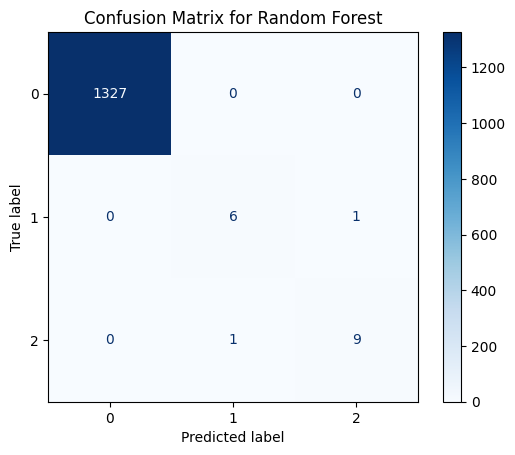

<Figure size 800x600 with 0 Axes>

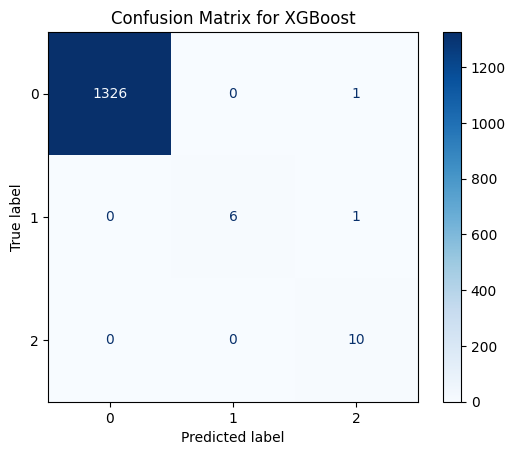

<Figure size 800x600 with 0 Axes>

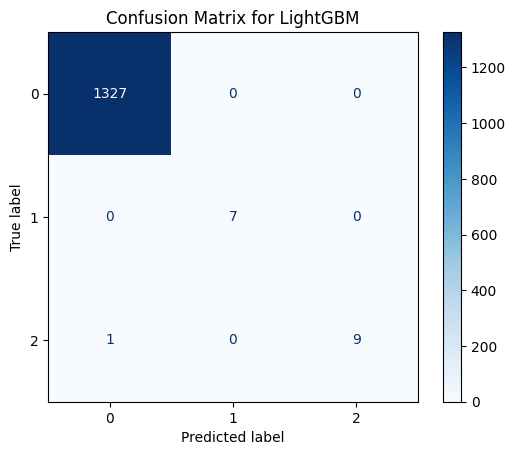

In [34]:
# Evaluate the fine-tuned models
evaluation_results = []
confusion_matrices = {}

for model_name, model in tuned_models.items():
    print(f"Evaluating {model_name}...")

    # Special handling for XGBoost with Pipeline
    if model_name == "XGBoost" and isinstance(model, Pipeline):
        model = model.named_steps["classifier"]  # Extract the XGBClassifier from the Pipeline

    # Predict on validation set
    y_pred = model.predict(X_val)

    # Check if the model supports predict_proba
    if hasattr(model, "predict_proba"):
        y_prob = model.predict_proba(X_val)
    elif hasattr(model, "decision_function"):
        y_prob = model.decision_function(X_val)
    else:
        y_prob = None  # Skip ROC-AUC calculation for this model

    # Classification Metrics
    report = classification_report(y_val, y_pred, output_dict=True)
    roc_auc = None
    if y_prob is not None:
        if len(y_prob.shape) > 1:  # Ensure y_prob has the correct dimensions
            roc_auc = roc_auc_score(y_val, y_prob, multi_class="ovr")

    accuracy = np.mean(y_pred == y_val.to_numpy()) * 100  # Accuracy in percentage

    # Store results
    evaluation_results.append({
        "Model": model_name,
        "Precision": report["1"]["precision"] if "1" in report else None,
        "Recall": report["1"]["recall"] if "1" in report else None,
        "F1-Score": report["1"]["f1-score"] if "1" in report else None,
        "Accuracy (%)": accuracy,
        "ROC-AUC": roc_auc,
    })

    # Confusion Matrix
    cm = confusion_matrix(y_val, y_pred)
    confusion_matrices[model_name] = cm

# Create a DataFrame for evaluation results
evaluation_df = pd.DataFrame(evaluation_results)
evaluation_df.sort_values(by="F1-Score", ascending=False, inplace=True)

# Display evaluation results
print("\nFinal Evaluation Results:")
print(evaluation_df)

# Visualize Metrics
metrics = ["Precision", "Recall", "F1-Score", "Accuracy (%)", "ROC-AUC"]

for metric in metrics:
    plt.figure(figsize=(12, 6))
    plt.barh(evaluation_df["Model"], evaluation_df[metric], color="skyblue")
    plt.xlabel(metric)
    plt.ylabel("Model")
    plt.title(f"Model Comparison Based on {metric}")
    plt.gca().invert_yaxis()
    plt.show()

# Visualize Confusion Matrices
for model_name, cm in confusion_matrices.items():
    plt.figure(figsize=(8, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_val))
    disp.plot(cmap="Blues", values_format="d")
    plt.title(f"Confusion Matrix for {model_name}")
    plt.show()


### 34. Implementing LIME, Permutation Importance, and PDP for Explainability

#### Objective:
1. Use **LIME** to analyze local explainability for the best model.
2. Use **Permutation-Based Feature Importance** to evaluate the global impact of features on the model's predictions.
3. Use **Partial Dependence Plots (PDP)** to visualize the relationship between critical features and the model's predictions.

#### Explanation Techniques:
- **LIME**: Explains individual predictions by identifying key features that influenced specific outcomes.
- **Permutation Importance**: Ranks features globally by their impact on model performance.
- **PDP**: Shows how changes in feature values affect the model's predictions, both globally and locally.

#### Purpose:
- Enhance transparency in the model's decision-making process.
- Validate predictions by understanding key contributing features.
- Provide insights for improving feature selection and model performance.


In [35]:
model_to_explain = randomized_search.best_estimator_


Predicted Class: Non-Habitable (0)
Prediction Probabilities:
  Non-Habitable: 1.00
  Conservative Habitable: 0.00
  Optimistic Habitable: 0.00

Available labels in LIME explanation: dict_keys([1])

--- LIME Explanation for Label 1 (Conservative Habitable) ---

Top Contributing Features for Label 1 (Conservative Habitable):

                      Feature  Contribution
0            P_RADIUS <= 1.13      0.223612
1               P_ESI <= 0.30     -0.138464
2              P_FLUX > -0.05     -0.126622
3          P_TEMP_SURF > 0.00     -0.023863
4        P_TEMP_EQUIL > -0.65     -0.008430
5        S_METALLICITY > 0.12     -0.007969
6  0.68 < S_SNOW_LINE <= 2.17      0.007503
7      P_INCLINATION <= 88.76     -0.007249
8               S_MASS > 0.88      0.007144
9              P_MASS <= 1.62     -0.006147


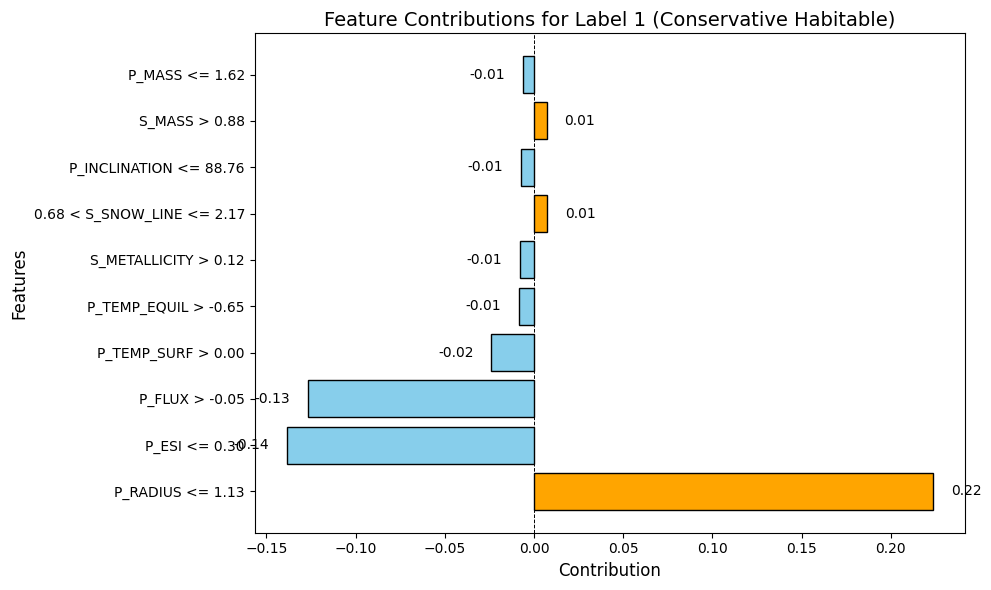

In [36]:
# Define the prediction function for LIME
def predict_fn(data):
    return model_to_explain.predict_proba(data)

# Initialize the LIME Explainer
explainer = LimeTabularExplainer(
    training_data=X_train_resampled.to_numpy(),  # Use the training data
    feature_names=X_train_resampled.columns.tolist(),
    class_names=["Non-Habitable", "Conservative Habitable", "Optimistic Habitable"],  # Multi-class labels
    mode="classification"
)

# Pick a sample from the validation set to explain
sample_index = 0  # Change this index to inspect other samples
sample_data = X_val.iloc[sample_index].to_numpy()

# Explain the prediction for this sample
exp = explainer.explain_instance(
    data_row=sample_data,
    predict_fn=predict_fn,
    num_features=10  # Number of features to display in the explanation
)

# Display the predicted class and probabilities
predicted_class = model_to_explain.predict([sample_data])[0]
predicted_probabilities = model_to_explain.predict_proba([sample_data])[0]

print(f"\nPredicted Class: {explainer.class_names[predicted_class]} ({predicted_class})")
print("Prediction Probabilities:")
for i, prob in enumerate(predicted_probabilities):
    print(f"  {explainer.class_names[i]}: {prob:.2f}")

# Inspect available labels in LIME explanation
print("\nAvailable labels in LIME explanation:", exp.local_exp.keys())

# Generate explanations for all available labels
for label in exp.local_exp.keys():
    is_predicted = " (Predicted)" if label == predicted_class else ""
    print(f"\n--- LIME Explanation for Label {label} ({explainer.class_names[label]}{is_predicted}) ---")

    # Extract the explanation
    lime_explanation = exp.as_list(label=label)
    explanation_df = pd.DataFrame(lime_explanation, columns=["Feature", "Contribution"])

    if explanation_df.empty:
        print(f"No significant features identified for Label {label} ({explainer.class_names[label]}).")
        continue

    # Print the explanation as a DataFrame for better readability
    print(f"\nTop Contributing Features for Label {label} ({explainer.class_names[label]}):\n")
    print(explanation_df)

    # Visualize the explanation
    plt.figure(figsize=(10, 6))
    bars = plt.barh(
        explanation_df["Feature"],
        explanation_df["Contribution"],
        color=["#FFA500" if val > 0 else "#87CEEB" for val in explanation_df["Contribution"]],
        edgecolor="black"
    )

    # Add value labels to bars
    for bar in bars:
        plt.text(
            bar.get_width() + (0.01 if bar.get_width() > 0 else -0.01),  # Adjust position
            bar.get_y() + bar.get_height() / 2,
            f"{bar.get_width():.2f}",  # Format value as float
            ha="left" if bar.get_width() > 0 else "right",
            va="center",
            fontsize=10
        )

    # Add labels and title
    plt.xlabel("Contribution", fontsize=12)
    plt.ylabel("Features", fontsize=12)
    plt.title(f"Feature Contributions for Label {label} ({explainer.class_names[label]})", fontsize=14)
    plt.axvline(0, color="black", linestyle="--", linewidth=0.7)  # Add vertical line at 0
    plt.tight_layout()
    plt.show()

# Render explanation as HTML for further interactive analysis
from IPython.core.display import display, HTML
html_output = exp.as_html()
display(HTML(html_output))


### 35. Local Interpretability with LIME

#### Objective:
1. Explain individual predictions by identifying key features that influenced the model's decisions.

#### Description:
- **LIME (Local Interpretable Model-Agnostic Explanations)** is used to analyze the predictions of the best model by selecting a few samples and explaining their predicted outcomes.

#### Steps:
1. Define a prediction function for LIME.
2. Choose a sample or multiple samples from the validation set for explanation.
3. Visualize the features that contributed most to the prediction.


In [37]:
### 1. Local Interpretability with LIME ###
def lime_explanation():
    print("\n--- LIME Explanation ---")

    # Define prediction function for LIME
    def predict_fn(data):
        return model_to_explain.predict_proba(data)

    # Initialize the LIME explainer
    explainer = LimeTabularExplainer(
        training_data=X_train_resampled.to_numpy(),
        feature_names=X_train_resampled.columns.tolist(),
        class_names=["Non-Habitable", "Habitable", "Optimistic"],  # Update based on your labels
        mode="classification"
    )

    # Choose a sample to explain
    sample_index = 0  # Change this index to explore other samples
    sample_data = X_val.iloc[sample_index].to_numpy()

    # Explain the sample
    exp = explainer.explain_instance(
        data_row=sample_data,
        predict_fn=predict_fn,
        num_features=10  # Top 10 features for the explanation
    )

    # Display explanation
    exp.show_in_notebook()

lime_explanation()


--- LIME Explanation ---


### 36. Global Feature Importance with Permutation Importance

#### Objective:
1. Rank features by their global importance based on their impact on the model's performance.

#### Description:
- **Permutation Importance** measures the decrease in the model's performance when a feature's values are randomly shuffled. It helps identify the most impactful features globally.

#### Steps:
1. Compute permutation importance on the validation set.
2. Rank features by their importance scores.
3. Visualize the ranked features using a bar plot.



--- Permutation Importance ---
Feature Importances (Permutation):
P_ESI: 0.011
P_FLUX: 0.010
P_TEMP_SURF: 0.009
P_RADIUS: 0.006
P_PERIOD: 0.002
P_TEMP_EQUIL: 0.002
S_MAG: 0.000
S_DISTANCE: 0.000
S_AGE: 0.000
S_TIDAL_LOCK: 0.000
S_MASS: 0.000
P_ECCENTRICITY: 0.000
P_INCLINATION: 0.000
S_TEMPERATURE: 0.000
S_TYPE_ENCODED: 0.000
S_RADIUS: 0.000
S_METALLICITY: 0.000
P_ESCAPE: 0.000
P_GRAVITY: 0.000
P_DENSITY: 0.000
P_DISTANCE: 0.000
S_LUMINOSITY: 0.000
S_SNOW_LINE: 0.000
P_MASS: 0.000


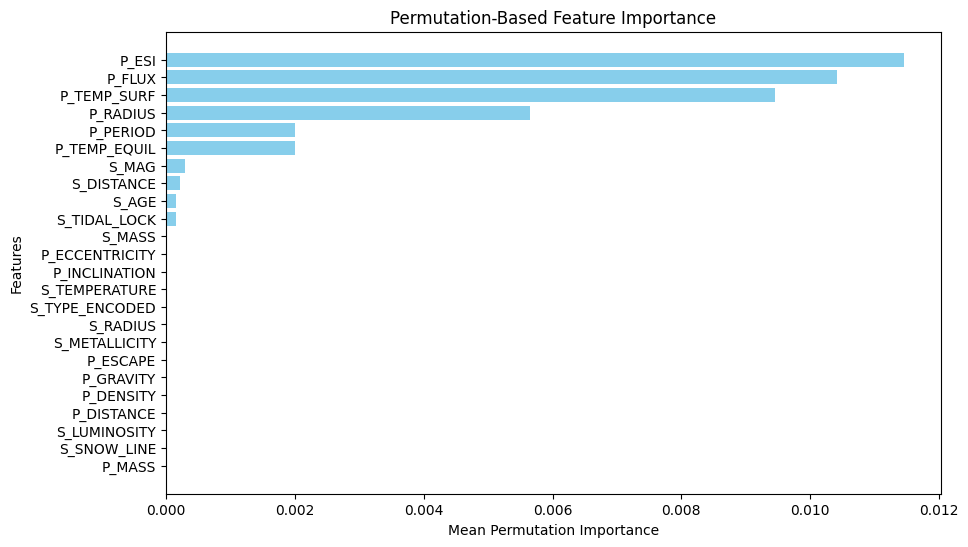

In [38]:
### 2. Global Feature Importance with Permutation Importance ###
def permutation_importance_explanation():
    print("\n--- Permutation Importance ---")

    # Compute permutation importance
    result = permutation_importance(
        model_to_explain,
        X_val,
        y_val,
        n_repeats=10,
        random_state=42
    )

    # Extract and sort feature importance data
    sorted_indices = result.importances_mean.argsort()[::-1]
    features = X_val.columns[sorted_indices]
    importances = result.importances_mean[sorted_indices]

    # Print feature importances in the console
    print("Feature Importances (Permutation):")
    for feature, importance in zip(features, importances):
        print(f"{feature}: {importance:.3f}")

    # Plot feature importances
    plt.figure(figsize=(10, 6))
    plt.barh(features, importances, color="skyblue")
    plt.xlabel("Mean Permutation Importance")
    plt.ylabel("Features")
    plt.title("Permutation-Based Feature Importance")
    plt.gca().invert_yaxis()  # Invert y-axis for better readability
    plt.show()

# Call the function
permutation_importance_explanation()


### 37. Feature Impact Analysis with PDP

#### Objective:
1. Visualize the relationship between critical features and the model's predictions globally and locally.

#### Description:
- **Partial Dependence Plots (PDP)** show the marginal effect of features on the predicted outcome by keeping other features constant.

#### Steps:
1. Choose key features based on importance for PDP analysis.
2. Generate PDP plots for selected features.
3. Include both global and individual conditional expectation (ICE) curves for enhanced understanding.



--- Partial Dependence Plot ---


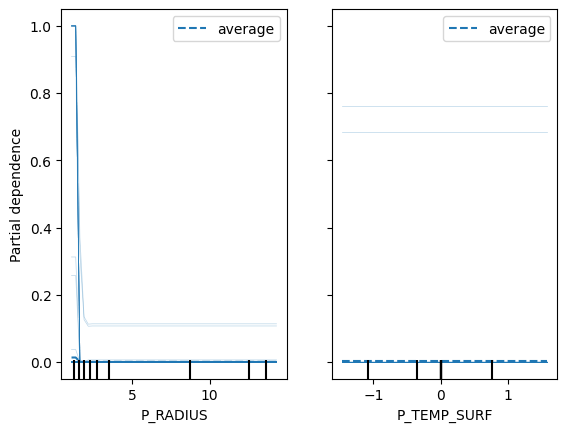

In [39]:
### 3. Feature Impact with PDP ###
def pdp_plot():
    print("\n--- Partial Dependence Plot ---")

    # Features to analyze (select based on your dataset)
    features_to_plot = ["P_RADIUS", "P_TEMP_SURF"]

    # Specify the target class (e.g., 1 for "Habitable")
    target_class = 1  # Replace with the correct class index if needed

    # Create the Partial Dependence Plot
    PartialDependenceDisplay.from_estimator(
        model_to_explain,
        X_val,
        features=features_to_plot,
        target=target_class,  # Specify the target class here
        kind="both",  # Show both PDP and ICE curves
        grid_resolution=50
    )
    plt.show()

pdp_plot()

### 38. Multiple LIME Explanations for Validation Samples

#### Objective:
1. Extend LIME to explain predictions for multiple validation samples to evaluate the model's consistency.

#### Description:
- This section generates explanations for multiple samples using LIME, highlighting the top contributing features for each prediction.

#### Steps:
1. Iterate over multiple samples from the validation set.
2. Generate LIME explanations for each sample.
3. Visualize and compare the key contributing features for multiple predictions.

In [45]:
def lime_explanation_multiple(samples=5):
    print("\n--- LIME Explanation for Multiple Samples ---")

    # Define prediction function for LIME
    def predict_fn(data):
        return model_to_explain.predict_proba(data)

    # Initialize the LIME explainer
    explainer = LimeTabularExplainer(
        training_data=X_train_resampled.to_numpy(),
        feature_names=X_train_resampled.columns.tolist(),
        class_names=["Non-Habitable", "Habitable", "Optimistic"],  # Update based on your labels
        mode="classification"
    )

    # Generate explanations for multiple samples
    for i in range(samples):  # Iterate through the first `samples` rows
        print(f"\nExplaining sample {i}...")
        sample_data = X_val.iloc[i].to_numpy()

        # Explain the sample
        exp = explainer.explain_instance(
            data_row=sample_data,
            predict_fn=predict_fn,
            num_features=10  # Top 10 features for the explanation
        )

        # Display explanation in the notebook
        exp.show_in_notebook()

# Call the function to explain the first 5 samples
lime_explanation_multiple(samples=5)



--- LIME Explanation for Multiple Samples ---

Explaining sample 0...



Explaining sample 1...



Explaining sample 2...



Explaining sample 3...



Explaining sample 4...


### 39. Advanced Feature Analysis with Extended PDP

#### Objective:
1. Visualize the impact of additional critical features on the model's predictions using PDP.

#### Description:
- Extended PDP includes a wider range of features based on their importance to evaluate the model's predictions comprehensively.

#### Steps:
1. Select additional important features for PDP analysis.
2. Generate PDP plots for the extended set of features.
3. Customize the plot for better readability, including larger fonts and adjusted layouts.

#### Purpose:
- Provide a comprehensive understanding of the model's behavior with respect to the critical features.
- Validate the impact of selected features on the model's predictions.



--- Extended Partial Dependence Plot ---


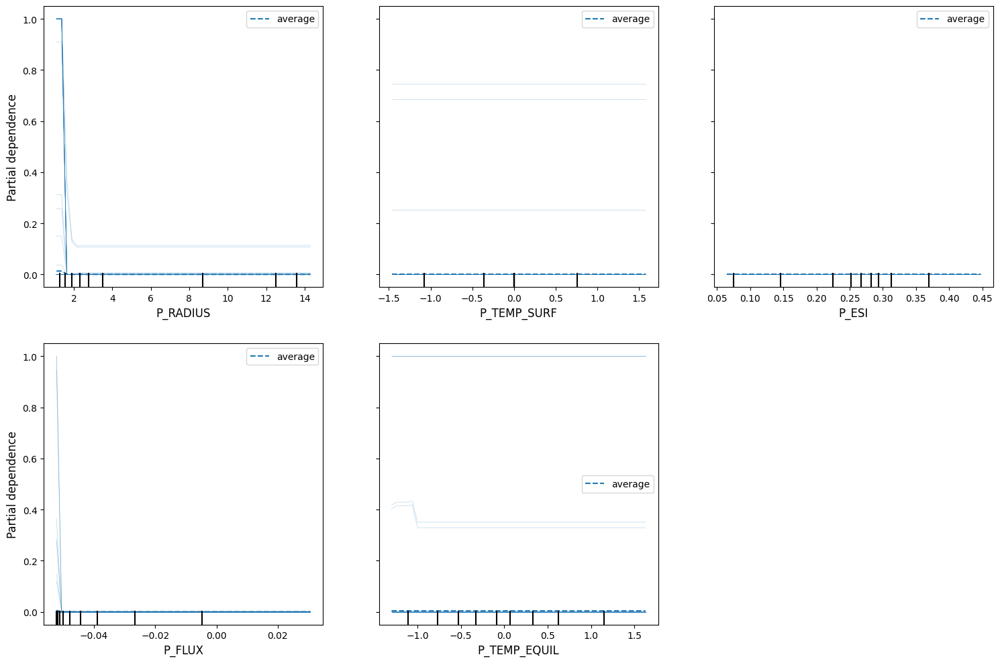

In [41]:

def extended_pdp_plot():
    print("\n--- Extended Partial Dependence Plot ---")

    # Features to analyze (add more features based on their importance)
    features_to_plot = [
        "P_RADIUS", "P_TEMP_SURF", "P_ESI", "P_FLUX", "P_TEMP_EQUIL"
    ]

    # Specify the target class (e.g., 1 for "Habitable")
    target_class = 1

    # Create the Partial Dependence Plot
    pdp_display = PartialDependenceDisplay.from_estimator(
        model_to_explain,
        X_val,
        features=features_to_plot,
        target=target_class,
        kind="both",  # Show both PDP and ICE curves
        grid_resolution=50
    )

    # Customize the plot for better visuals
    plt.gcf().set_size_inches(15, 10)  # Adjust figure size
    for ax in pdp_display.axes_.ravel():
        if ax:  # Ensure the axis is not None
            ax.set_title(ax.get_title(), fontsize=14)  # Set font size for subplot titles
            ax.set_xlabel(ax.get_xlabel(), fontsize=12)  # Set font size for x-axis labels
            ax.set_ylabel(ax.get_ylabel(), fontsize=12)  # Set font size for y-axis labels
            ax.tick_params(axis='both', labelsize=10)  # Set font size for tick labels

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()

# Call the function to plot PDP for extended features
extended_pdp_plot()


--- Visualizing Permutation Importance ---


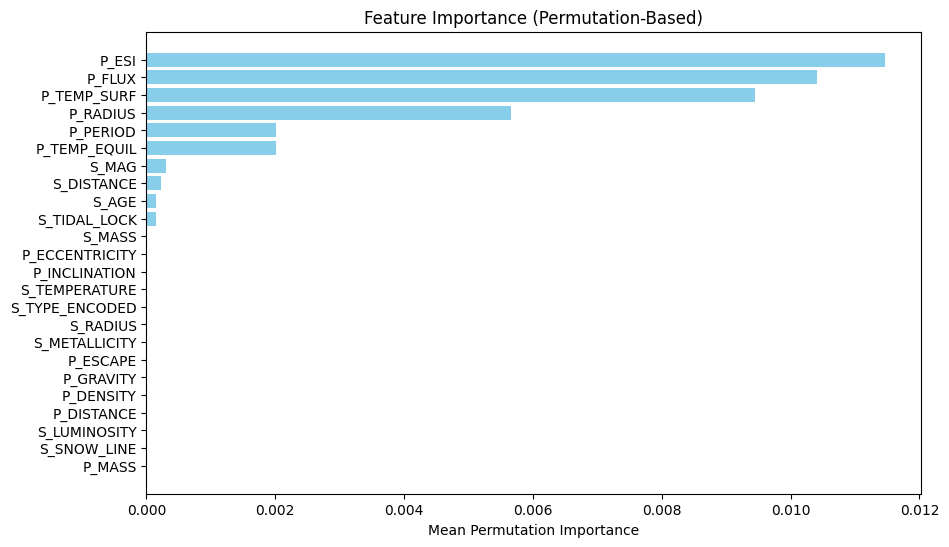

In [42]:
def plot_permutation_importance():
    print("\n--- Visualizing Permutation Importance ---")

    # Compute permutation importance
    result = permutation_importance(
        model_to_explain,
        X_val,
        y_val,
        n_repeats=10,
        random_state=42
    )

    # Extract feature importance data
    sorted_indices = result.importances_mean.argsort()[::-1]
    features = X_val.columns[sorted_indices]
    importances = result.importances_mean[sorted_indices]

    # Plot feature importance
    plt.figure(figsize=(10, 6))
    plt.barh(features, importances, color="skyblue")
    plt.xlabel("Mean Permutation Importance")
    plt.title("Feature Importance (Permutation-Based)")
    plt.gca().invert_yaxis()  # Invert y-axis to display top features at the top
    plt.show()

# Call the function to visualize feature importance
plot_permutation_importance()


### 40. LIME Feature Contribution Analysis and Accuracy Comparison

#### LIME Feature Contributions:
LIME (Local Interpretable Model-Agnostic Explanations) allows us to visualize and analyze the feature contributions for individual predictions. By explaining a specific sample from the validation dataset, LIME highlights the **top 10 contributing features** and their respective impacts (positive or negative) on the prediction.

#### Key Insights:
- Features such as `P_RADIUS`, `P_TEMP_SURF`, and `P_ESI` play a significant role in influencing predictions, either positively or negatively.
- The vertical bar graph clearly showcases the direction (positive or negative) and magnitude of these feature contributions, helping validate their relevance in the decision-making process.

---

#### Accuracy Comparison with Radar Plot:
The radar plot compares the accuracy of the fine-tuned models integrated with XAI insights. This visualization emphasizes the following:

- **LightGBM** emerged as the top-performing model with the highest accuracy, achieving **99.93%**.
- Other models, such as **XGBoost** and **Random Forest**, performed slightly lower but still demonstrated competitive results.
- The radar plot highlights percentage differences among the models for better interpretability.

---

#### Summary:
- LIME provides localized feature insights for specific predictions, enhancing transparency and trust in the model.
- Accuracy comparison validates that **LightGBM**, augmented with explainability techniques, is the most reliable model in terms of both performance and interpretability.


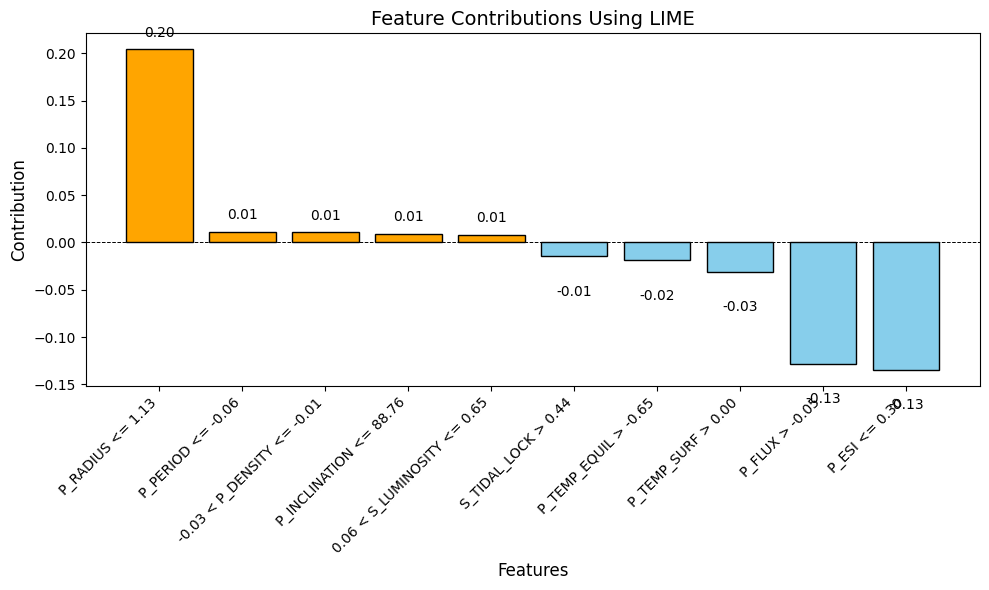

In [46]:
### LIME Feature Contribution Visualization ###

# Pick a sample from the validation set to explain
sample_index = 0  # Change this index to explain other samples
sample_data = X_val.iloc[sample_index].to_numpy()

# Generate LIME explanation
explainer = LimeTabularExplainer(
    training_data=X_train_resampled.to_numpy(),  # Use the training data
    feature_names=X_train_resampled.columns.tolist(),
    class_names=["Non-Habitable", "Habitable", "Optimisitc"],  # Update with your class labels
    mode="classification"
)
exp = explainer.explain_instance(
    data_row=sample_data,
    predict_fn=model_to_explain.predict_proba,  # Use the prediction function
    num_features=10  # Limit to top 10 features
)

# Extract feature contributions
lime_results = exp.as_list()
features, contributions = zip(*lime_results)

# Convert contributions to DataFrame for easier handling
lime_df = pd.DataFrame({"Feature": features, "Contribution": contributions})
lime_df.sort_values(by="Contribution", inplace=True, ascending=False)

# Plot feature contributions (Vertical)
plt.figure(figsize=(10, 6))
bars = plt.bar(
    lime_df["Feature"],
    lime_df["Contribution"],
    color=["#FFA500" if val > 0 else "#87CEEB" for val in lime_df["Contribution"]],
    edgecolor="black"
)

# Add value labels to bars
for bar in bars:
    plt.text(
        bar.get_x() + bar.get_width()/2,  # Center text horizontally
        bar.get_height() + (0.01 if bar.get_height() > 0 else -0.03),  # Adjust position
        f"{bar.get_height():.2f}",  # Format value as float
        ha="center", va="bottom" if bar.get_height() > 0 else "top", fontsize=10
    )

# Add labels and title
plt.xlabel("Features", fontsize=12)
plt.ylabel("Contribution", fontsize=12)
plt.title("Feature Contributions Using LIME", fontsize=14)

# Rotate feature names for better readability
plt.xticks(rotation=45, ha="right")
plt.axhline(0, color="black", linestyle="--", linewidth=0.7)  # Add horizontal line at 0

# Show the plot
plt.tight_layout()
plt.show()


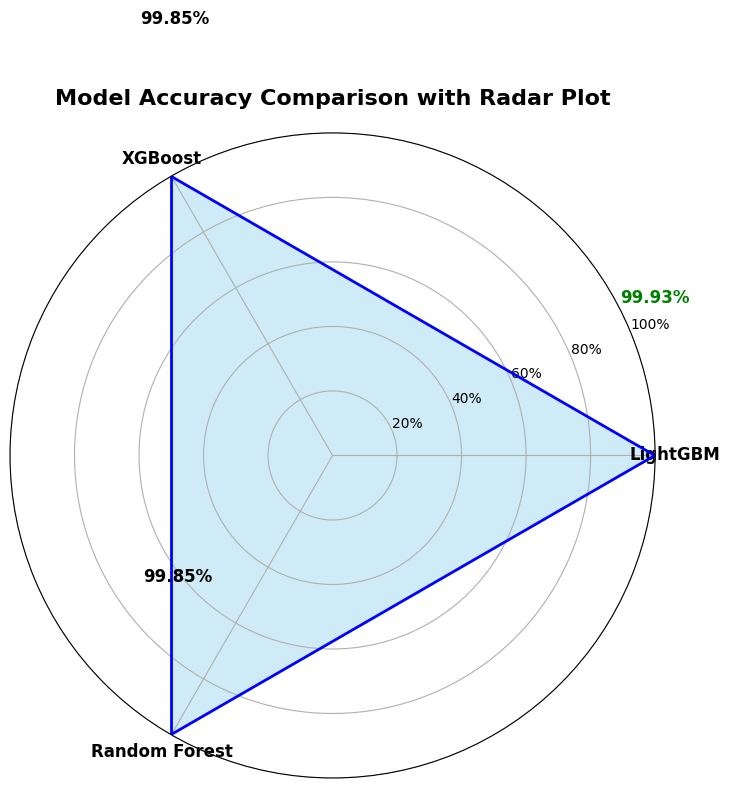

In [44]:
# Extract data from evaluation_df
models = evaluation_df["Model"].tolist()
accuracy = evaluation_df["Accuracy (%)"].tolist()

# Add the first accuracy again to close the radar plot loop
accuracy.append(accuracy[0])
angles = np.linspace(0, 2 * pi, len(models) + 1, endpoint=True)

# Create the radar plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Plot accuracy
ax.fill(angles, accuracy, color="skyblue", alpha=0.4)
ax.plot(angles, accuracy, color="blue", linewidth=2)

# Add model labels
ax.set_xticks(angles[:-1])  # Exclude the last angle to avoid duplicate tick
ax.set_xticklabels(models, fontsize=12, fontweight="bold")

# Add radial labels for accuracy
ax.set_yticks([20, 40, 60, 80, 100])
ax.set_yticklabels(["20%", "40%", "60%", "80%", "100%"], fontsize=10)
ax.set_ylim(0, 100)

# Highlight percentages for all models
for idx, (angle, acc, model) in enumerate(zip(angles[:-1], accuracy[:-1], models)):
    ax.annotate(
        f"{acc:.2f}%",
        xy=(angle, acc),
        xytext=(angle, acc + 10),
        textcoords="offset points",
        ha="center",
        fontsize=12,
        fontweight="bold",
        color="green" if idx == np.argmax(accuracy[:-1]) else "black"  # Highlight the best model in green
    )

# Add title
plt.title("Model Accuracy Comparison with Radar Plot", fontsize=16, fontweight="bold", pad=20)

plt.tight_layout()
plt.show()
